In [92]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [93]:
import os
import numpy as np
from Classification.cnn1D_model import VibrationDataset, CNN1D_Wide, CNN1D_DS_Wide, CNN1D_DS
from Classification.cnn1D_model import train_and_evaluate, train_and_evaluate_with_kfold
import torch
from torch.utils.data import Dataset, DataLoader, random_split,Subset
from sklearn.model_selection import train_test_split
import random
import pandas as pd
from utils.baseline_xai import predict_single, summarize_attributions
from utils.baseline_xai import grad_times_input_relevance, smoothgrad_relevance, occlusion_signal_relevance, occlusion_simpler_relevance
from  visualization.relevance_visualization import visualize_with_label_attribution, visualize_lrp_single_sample, visualize_lrp_dft, visualize_lrp_fft, visualize_crp_heatmap, visualize_crp_timefreq, visualize_lrp_dft_extended
from utils.xai_implementation import compute_lrp_relevance, compute_dft_lrp_relevance, compute_fft_lrp_relevance, compute_dft_lrp_relevance_2, compute_dft_lrp_relevance_with_timefreq, compute_dft_lrp_relevance_once
from sklearn.model_selection import GroupKFold
from collections import Counter
from utils.crp_utils import *
from sklearn.model_selection import StratifiedGroupKFold


In [23]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [24]:
device

device(type='cuda')

In [6]:
# Load dataset, Stratify based on Labele and Operation, so that the train, test, val sets have appropriate amount of each group

data_directory = "../data/final/new_selection/normalized_windowed_downsampled_data_lessBAD"
dataset = VibrationDataset(data_directory, augment_bad=False)

# Create a combined stratification key (label_operation)
stratify_key = [f"{lbl}_{op}" for lbl, op in zip(dataset.labels, dataset.operations)]

# Stratified split by both label and operation
train_idx, temp_idx = train_test_split(
    range(len(dataset)), test_size=0.3, stratify=stratify_key
)
val_idx, test_idx = train_test_split(
    temp_idx, test_size=0.5, stratify=[stratify_key[i] for i in temp_idx]
)

# Create Subset datasets
train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)

# Verify split sizes and label distribution
print(f"Train size: {len(train_dataset)}, Val size: {len(val_dataset)}, Test size: {len(test_dataset)}")
print(f"Train good: {sum(dataset.labels[train_idx] == 0)}, Train bad: {sum(dataset.labels[train_idx] == 1)}")
print(f"Val good: {sum(dataset.labels[val_idx] == 0)}, Val bad: {sum(dataset.labels[val_idx] == 1)}")
print(f"Test good: {sum(dataset.labels[test_idx] == 0)}, Test bad: {sum(dataset.labels[test_idx] == 1)}")

# Class ratios
train_ratio = sum(dataset.labels[train_idx] == 0) / sum(dataset.labels[train_idx] == 1)
val_ratio = sum(dataset.labels[val_idx] == 0) / sum(dataset.labels[val_idx] == 1)
test_ratio = sum(dataset.labels[test_idx] == 0) / sum(dataset.labels[test_idx] == 1)
print(f"Class ratio (good/bad) - Train: {train_ratio:.2f}, Val: {val_ratio:.2f}, Test: {test_ratio:.2f}")

# Operation distribution
train_ops = Counter(dataset.operations[train_idx])
val_ops = Counter(dataset.operations[val_idx])
test_ops = Counter(dataset.operations[test_idx])
print(f"Train operations: {train_ops}")
print(f"Val operations: {val_ops}")
print(f"Test operations: {test_ops}")

# Creating DataLoaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

Train size: 4468, Val size: 957, Test size: 958
Train good: 3923, Train bad: 545
Val good: 840, Val bad: 117
Test good: 843, Test bad: 115
Class ratio (good/bad) - Train: 7.20, Val: 7.18, Test: 7.33
Train operations: Counter({np.str_('OP06'): 670, np.str_('OP04'): 586, np.str_('OP02'): 512, np.str_('OP12'): 481, np.str_('OP10'): 475, np.str_('OP11'): 417, np.str_('OP08'): 360, np.str_('OP14'): 303, np.str_('OP01'): 285, np.str_('OP07'): 237, np.str_('OP05'): 142})
Val operations: Counter({np.str_('OP06'): 144, np.str_('OP04'): 125, np.str_('OP02'): 110, np.str_('OP12'): 103, np.str_('OP10'): 102, np.str_('OP11'): 89, np.str_('OP08'): 77, np.str_('OP14'): 65, np.str_('OP01'): 61, np.str_('OP07'): 51, np.str_('OP05'): 30})
Test operations: Counter({np.str_('OP06'): 144, np.str_('OP04'): 126, np.str_('OP02'): 110, np.str_('OP12'): 103, np.str_('OP10'): 102, np.str_('OP11'): 89, np.str_('OP08'): 77, np.str_('OP14'): 65, np.str_('OP01'): 61, np.str_('OP07'): 51, np.str_('OP05'): 30})


In [72]:
# this code insures that the sample splitted into 5 second will not be present in train/test/val groups, as it prevents data leakage from a same sample

data_directory = "../data/final/new_selection/normalized_windowed_downsampled_data_lessBAD"
dataset = VibrationDataset(data_directory, augment_bad=False)

# Create a combined stratification key (label_operation)
stratify_key = [f"{lbl}_{op}" for lbl, op in zip(dataset.labels, dataset.operations)]

# First use StratifiedGroupKFold to get a 70/30 split while respecting file groups
sgkf = StratifiedGroupKFold(n_splits=10, shuffle=True, random_state=42)
splits = list(sgkf.split(range(len(dataset)), stratify_key, groups=dataset.file_groups))

# Take 7 splits for training (70%), and 3 splits for test+val (30%)
train_idx = []
temp_idx = []

# First 7 splits go to training
for i in range(7):
    train_idx.extend(splits[i][1])  # [1] contains the indices for the test fold

# Last 3 splits go to test+val
for i in range(7, 10):
    temp_idx.extend(splits[i][1])

# Now split the 30% into equal parts for validation and test
# Using StratifiedGroupKFold again for the val/test split
temp_stratify = [stratify_key[i] for i in temp_idx]
temp_groups = dataset.file_groups[temp_idx]

# Use just 2 splits to get a 50/50 division of the temp dataset (15%/15% of total)
sgkf_temp = StratifiedGroupKFold(n_splits=2, shuffle=True, random_state=42)
temp_splits = list(sgkf_temp.split(range(len(temp_idx)), temp_stratify, groups=temp_groups))

# Get val and test indices, mapping back to original dataset indices
val_idx = [temp_idx[i] for i in temp_splits[0][1]]
test_idx = [temp_idx[i] for i in temp_splits[1][1]]

# Create Subset datasets
train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)



# Verify split sizes and label distribution
print(f"Train size: {len(train_dataset)}, Val size: {len(val_dataset)}, Test size: {len(test_dataset)}")
print(f"Train good: {sum(dataset.labels[train_idx] == 0)}, Train bad: {sum(dataset.labels[train_idx] == 1)}")
print(f"Val good: {sum(dataset.labels[val_idx] == 0)}, Val bad: {sum(dataset.labels[val_idx] == 1)}")
print(f"Test good: {sum(dataset.labels[test_idx] == 0)}, Test bad: {sum(dataset.labels[test_idx] == 1)}")

# Class ratios
train_ratio = sum(dataset.labels[train_idx] == 0) / sum(dataset.labels[train_idx] == 1)
val_ratio = sum(dataset.labels[val_idx] == 0) / sum(dataset.labels[val_idx] == 1)
test_ratio = sum(dataset.labels[test_idx] == 0) / sum(dataset.labels[test_idx] == 1)
print(f"Class ratio (good/bad) - Train: {train_ratio:.2f}, Val: {val_ratio:.2f}, Test: {test_ratio:.2f}")

# Operation distribution
train_ops = Counter(dataset.operations[train_idx])
val_ops = Counter(dataset.operations[val_idx])
test_ops = Counter(dataset.operations[test_idx])
print(f"Train operations: {train_ops}")
print(f"Val operations: {val_ops}")
print(f"Test operations: {test_ops}")

# Creating DataLoaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)



# File group distribution
train_groups = set(dataset.file_groups[train_idx])
val_groups = set(dataset.file_groups[val_idx])
test_groups = set(dataset.file_groups[test_idx])

print(f"\nUnique file groups in Train: {len(train_groups)}")
print(f"Unique file groups in Val: {len(val_groups)}")
print(f"Unique file groups in Test: {len(test_groups)}")

# Check for overlap between splits
train_val_overlap = train_groups.intersection(val_groups)
train_test_overlap = train_groups.intersection(test_groups)
val_test_overlap = val_groups.intersection(test_groups)

print(f"\nFile group overlap between Train and Val: {len(train_val_overlap)}")
print(f"File group overlap between Train and Test: {len(train_test_overlap)}")
print(f"File group overlap between Val and Test: {len(val_test_overlap)}")

Train size: 4386, Val size: 1018, Test size: 979
Train good: 3876, Train bad: 510
Val good: 859, Val bad: 159
Test good: 871, Test bad: 108
Class ratio (good/bad) - Train: 7.60, Val: 5.40, Test: 8.06
Train operations: Counter({np.str_('OP06'): 686, np.str_('OP04'): 605, np.str_('OP02'): 506, np.str_('OP12'): 488, np.str_('OP10'): 408, np.str_('OP08'): 361, np.str_('OP11'): 339, np.str_('OP14'): 319, np.str_('OP01'): 280, np.str_('OP07'): 244, np.str_('OP05'): 150})
Val operations: Counter({np.str_('OP04'): 172, np.str_('OP12'): 135, np.str_('OP11'): 130, np.str_('OP06'): 119, np.str_('OP10'): 112, np.str_('OP08'): 76, np.str_('OP01'): 70, np.str_('OP14'): 65, np.str_('OP02'): 62, np.str_('OP07'): 46, np.str_('OP05'): 31})
Test operations: Counter({np.str_('OP02'): 164, np.str_('OP10'): 159, np.str_('OP06'): 153, np.str_('OP11'): 126, np.str_('OP08'): 77, np.str_('OP12'): 64, np.str_('OP04'): 60, np.str_('OP01'): 57, np.str_('OP07'): 49, np.str_('OP14'): 49, np.str_('OP05'): 21})

Uniqu

Using device: cuda
Epoch [1/30] - Train Loss: 0.3598, Train Acc: 0.8835 - Val Loss: 0.3612, Val Acc: 0.8438 
Epoch [2/30] - Train Loss: 0.1578, Train Acc: 0.9343 - Val Loss: 0.0403, Val Acc: 0.9862 
Epoch [3/30] - Train Loss: 0.0560, Train Acc: 0.9840 - Val Loss: 0.0128, Val Acc: 1.0000 
Epoch [4/30] - Train Loss: 0.0319, Train Acc: 0.9900 - Val Loss: 0.0300, Val Acc: 0.9912 
Epoch [5/30] - Train Loss: 0.0191, Train Acc: 0.9957 - Val Loss: 0.0063, Val Acc: 0.9980 
Epoch [6/30] - Train Loss: 0.0252, Train Acc: 0.9934 - Val Loss: 0.0068, Val Acc: 1.0000 
Epoch [7/30] - Train Loss: 0.0154, Train Acc: 0.9975 - Val Loss: 0.0036, Val Acc: 1.0000 
Epoch [8/30] - Train Loss: 0.0096, Train Acc: 0.9977 - Val Loss: 0.0037, Val Acc: 1.0000 
Epoch [9/30] - Train Loss: 0.0120, Train Acc: 0.9968 - Val Loss: 0.0257, Val Acc: 0.9892 
Epoch [10/30] - Train Loss: 0.0097, Train Acc: 0.9979 - Val Loss: 0.0054, Val Acc: 0.9980 
Epoch [11/30] - Train Loss: 0.0104, Train Acc: 0.9975 - Val Loss: 0.0043, Val Ac

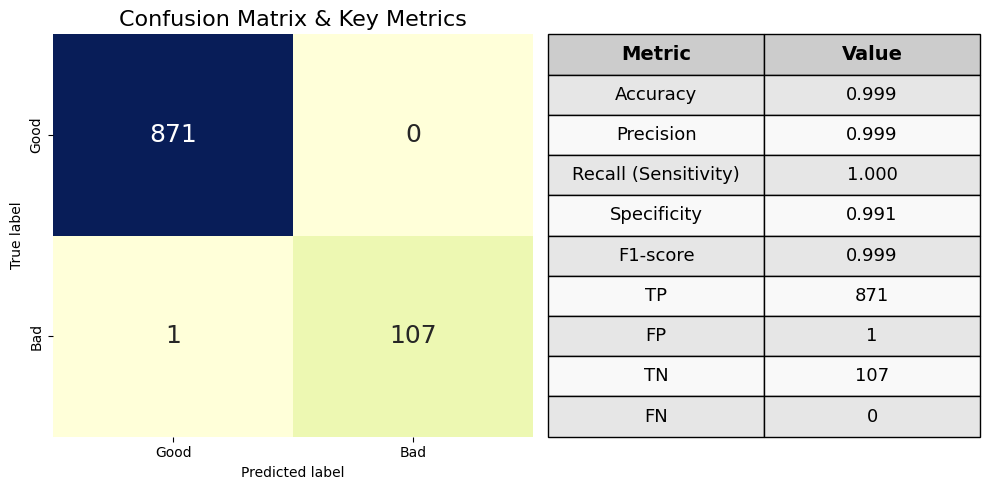

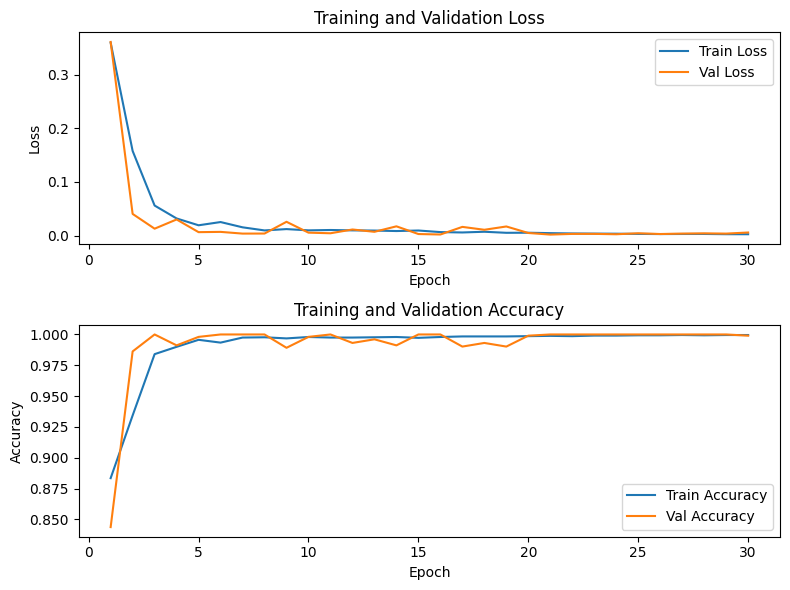

In [74]:
# ------------------------
#  Run Training & Evaluation
# ------------------------
# model = train_and_evaluate(train_loader, val_loader, test_loader)
best_model = train_and_evaluate(train_loader, val_loader, test_loader, Schedule=True)



In [75]:
# Save the trained model
torch.save(best_model.state_dict(), "../cnn1d_model20wideDS_SQ.ckpt")
print("✅ Model saved to cnn1d_model20wideDS_SQ.ckpt")
best_model.to(device)
best_model.eval()  # Switch to evaluation mode
print("✅ Model loaded and ready for explanations")
print(f"✅ Model is structured as  \n {best_model}")


✅ Model saved to cnn1d_model20wideDS_SQ.ckpt
✅ Model loaded and ready for explanations
✅ Model is structured as  
 CNN1D_DS_Wide(
  (conv1): Conv1d(3, 16, kernel_size=(25,), stride=(1,), padding=(12,))
  (gn1): GroupNorm(4, 16, eps=1e-05, affine=True)
  (pool1): MaxPool1d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv1d(16, 32, kernel_size=(15,), stride=(1,), padding=(7,))
  (gn2): GroupNorm(4, 32, eps=1e-05, affine=True)
  (pool2): MaxPool1d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv1d(32, 64, kernel_size=(9,), stride=(1,), padding=(4,))
  (gn3): GroupNorm(4, 64, eps=1e-05, affine=True)
  (pool3): MaxPool1d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc1): Linear(in_features=64, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=2, bias=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (relu): ReLU()
)


In [7]:
best_model = CNN1D_Wide()

best_model_path = "../cnn1d_model13.ckpt"
best_model.load_state_dict(torch.load(best_model_path, map_location=device, weights_only=True))
best_model.eval()
best_model.to(device)

CNN1D_Wide(
  (conv1): Conv1d(3, 16, kernel_size=(25,), stride=(1,), padding=(12,))
  (pool1): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout(p=0.2, inplace=False)
  (conv2): Conv1d(16, 32, kernel_size=(15,), stride=(1,), padding=(7,))
  (pool2): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout(p=0.2, inplace=False)
  (conv3): Conv1d(32, 64, kernel_size=(9,), stride=(1,), padding=(4,))
  (pool3): MaxPool1d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout3): Dropout(p=0.2, inplace=False)
  (conv4): Conv1d(64, 128, kernel_size=(5,), stride=(1,), padding=(2,))
  (pool4): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout4): Dropout(p=0.2, inplace=False)
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc1): Linear(in_features=128, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=2, bias=True)
  (drop

### Not normalized data

In [25]:
# this code insures that the sample splitted into 5 second will not be present in train/test/val groups, as it prevents data leakage from a same sample

data_directory = "../data/final/new_selection/Selected_data_grouped_windowed_downsampled_lessbad"
dataset = VibrationDataset(data_directory, augment_bad=False)

# Create a combined stratification key (label_operation)
stratify_key = [f"{lbl}_{op}" for lbl, op in zip(dataset.labels, dataset.operations)]

# First use StratifiedGroupKFold to get a 70/30 split while respecting file groups
sgkf = StratifiedGroupKFold(n_splits=10, shuffle=True, random_state=42)
splits = list(sgkf.split(range(len(dataset)), stratify_key, groups=dataset.file_groups))

# Take 7 splits for training (70%), and 3 splits for test+val (30%)
train_idx = []
temp_idx = []

# First 7 splits go to training
for i in range(7):
    train_idx.extend(splits[i][1])  # [1] contains the indices for the test fold

# Last 3 splits go to test+val
for i in range(7, 10):
    temp_idx.extend(splits[i][1])

# Now split the 30% into equal parts for validation and test
# Using StratifiedGroupKFold again for the val/test split
temp_stratify = [stratify_key[i] for i in temp_idx]
temp_groups = dataset.file_groups[temp_idx]

# Use just 2 splits to get a 50/50 division of the temp dataset (15%/15% of total)
sgkf_temp = StratifiedGroupKFold(n_splits=2, shuffle=True, random_state=42)
temp_splits = list(sgkf_temp.split(range(len(temp_idx)), temp_stratify, groups=temp_groups))

# Get val and test indices, mapping back to original dataset indices
val_idx = [temp_idx[i] for i in temp_splits[0][1]]
test_idx = [temp_idx[i] for i in temp_splits[1][1]]

# Create Subset datasets
train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)



# Verify split sizes and label distribution
print(f"Train size: {len(train_dataset)}, Val size: {len(val_dataset)}, Test size: {len(test_dataset)}")
print(f"Train good: {sum(dataset.labels[train_idx] == 0)}, Train bad: {sum(dataset.labels[train_idx] == 1)}")
print(f"Val good: {sum(dataset.labels[val_idx] == 0)}, Val bad: {sum(dataset.labels[val_idx] == 1)}")
print(f"Test good: {sum(dataset.labels[test_idx] == 0)}, Test bad: {sum(dataset.labels[test_idx] == 1)}")

# Class ratios
train_ratio = sum(dataset.labels[train_idx] == 0) / sum(dataset.labels[train_idx] == 1)
val_ratio = sum(dataset.labels[val_idx] == 0) / sum(dataset.labels[val_idx] == 1)
test_ratio = sum(dataset.labels[test_idx] == 0) / sum(dataset.labels[test_idx] == 1)
print(f"Class ratio (good/bad) - Train: {train_ratio:.2f}, Val: {val_ratio:.2f}, Test: {test_ratio:.2f}")

# Operation distribution
train_ops = Counter(dataset.operations[train_idx])
val_ops = Counter(dataset.operations[val_idx])
test_ops = Counter(dataset.operations[test_idx])
print(f"Train operations: {train_ops}")
print(f"Val operations: {val_ops}")
print(f"Test operations: {test_ops}")

# Creating DataLoaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)



# File group distribution
train_groups = set(dataset.file_groups[train_idx])
val_groups = set(dataset.file_groups[val_idx])
test_groups = set(dataset.file_groups[test_idx])

print(f"\nUnique file groups in Train: {len(train_groups)}")
print(f"Unique file groups in Val: {len(val_groups)}")
print(f"Unique file groups in Test: {len(test_groups)}")

# Check for overlap between splits
train_val_overlap = train_groups.intersection(val_groups)
train_test_overlap = train_groups.intersection(test_groups)
val_test_overlap = val_groups.intersection(test_groups)

print(f"\nFile group overlap between Train and Val: {len(train_val_overlap)}")
print(f"File group overlap between Train and Test: {len(train_test_overlap)}")
print(f"File group overlap between Val and Test: {len(val_test_overlap)}")

Train size: 4386, Val size: 1018, Test size: 979
Train good: 3876, Train bad: 510
Val good: 859, Val bad: 159
Test good: 871, Test bad: 108
Class ratio (good/bad) - Train: 7.60, Val: 5.40, Test: 8.06
Train operations: Counter({np.str_('OP06'): 686, np.str_('OP04'): 605, np.str_('OP02'): 506, np.str_('OP12'): 488, np.str_('OP10'): 408, np.str_('OP08'): 361, np.str_('OP11'): 339, np.str_('OP14'): 319, np.str_('OP01'): 280, np.str_('OP07'): 244, np.str_('OP05'): 150})
Val operations: Counter({np.str_('OP04'): 172, np.str_('OP12'): 135, np.str_('OP11'): 130, np.str_('OP06'): 119, np.str_('OP10'): 112, np.str_('OP08'): 76, np.str_('OP01'): 70, np.str_('OP14'): 65, np.str_('OP02'): 62, np.str_('OP07'): 46, np.str_('OP05'): 31})
Test operations: Counter({np.str_('OP02'): 164, np.str_('OP10'): 159, np.str_('OP06'): 153, np.str_('OP11'): 126, np.str_('OP08'): 77, np.str_('OP12'): 64, np.str_('OP04'): 60, np.str_('OP01'): 57, np.str_('OP07'): 49, np.str_('OP14'): 49, np.str_('OP05'): 21})

Uniqu

Using device: cuda
Epoch [1/30] - Train Loss: 0.2444, Train Acc: 0.9074 - Val Loss: 0.1770, Val Acc: 0.8998 
Epoch [2/30] - Train Loss: 0.0592, Train Acc: 0.9843 - Val Loss: 2.2093, Val Acc: 0.1562 
Epoch [3/30] - Train Loss: 0.0204, Train Acc: 0.9968 - Val Loss: 0.3028, Val Acc: 0.9204 
Epoch [4/30] - Train Loss: 0.0183, Train Acc: 0.9948 - Val Loss: 0.1089, Val Acc: 0.9686 
Epoch [5/30] - Train Loss: 0.0094, Train Acc: 0.9977 - Val Loss: 0.4260, Val Acc: 0.7967 
Epoch [6/30] - Train Loss: 0.0068, Train Acc: 0.9979 - Val Loss: 0.3382, Val Acc: 0.8458 
Epoch [7/30] - Train Loss: 0.0071, Train Acc: 0.9977 - Val Loss: 0.0042, Val Acc: 0.9990 
Epoch [8/30] - Train Loss: 0.0038, Train Acc: 0.9993 - Val Loss: 0.0752, Val Acc: 0.9764 
Epoch [9/30] - Train Loss: 0.0025, Train Acc: 0.9991 - Val Loss: 0.0028, Val Acc: 1.0000 
Epoch [10/30] - Train Loss: 0.0026, Train Acc: 0.9991 - Val Loss: 0.7735, Val Acc: 0.7102 
Epoch [11/30] - Train Loss: 0.0017, Train Acc: 0.9995 - Val Loss: 0.0112, Val Ac

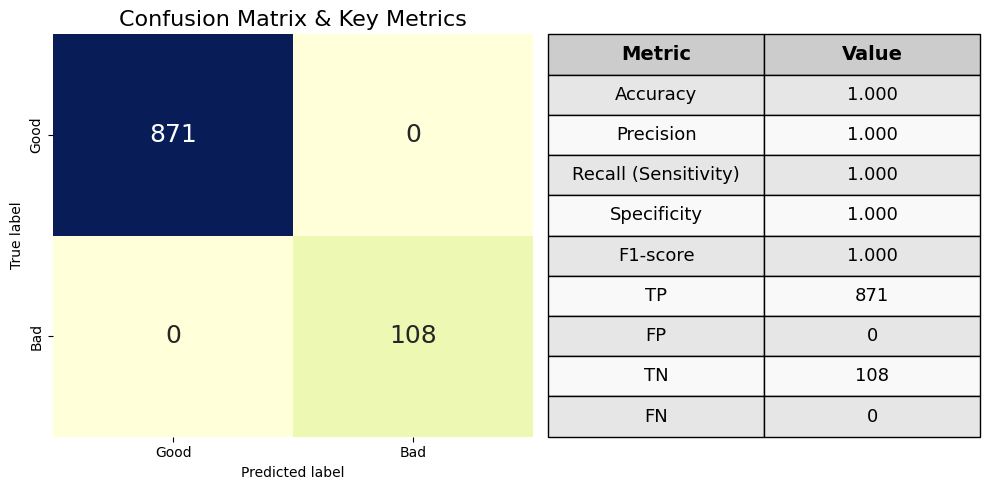

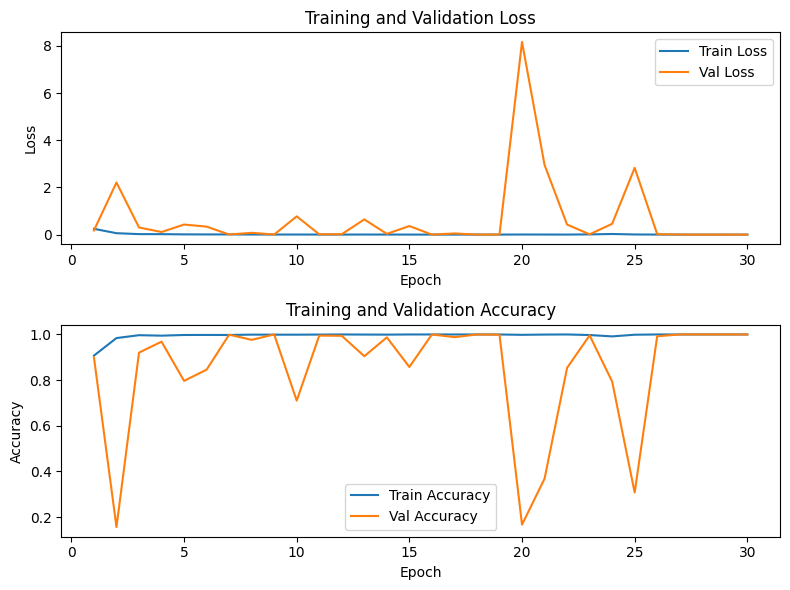

In [26]:
# ------------------------
#  Run Training & Evaluation for not normalized data
# ------------------------
# model = train_and_evaluate(train_loader, val_loader, test_loader)
best_model_unnormalized = train_and_evaluate(train_loader, val_loader, test_loader)



In [27]:
# Save the trained model
torch.save(best_model_unnormalized.state_dict(), "../cnn1d_model15_noNorm.ckpt")
print("✅ Model saved to cnn1d_model15_noNorm.ckpt")
best_model_unnormalized.to(device)
best_model_unnormalized.eval()  # Switch to evaluation mode
print("✅ un_normallized Model loaded and ready for explanations")
print(f"✅ Model is structured as  \n {best_model}")


✅ Model saved to cnn1d_model15_noNorm.ckpt
✅ un_normallized Model loaded and ready for explanations
✅ Model is structured as  
 CNN1D_DS_Wide(
  (conv1): Conv1d(3, 16, kernel_size=(25,), stride=(1,), padding=(12,))
  (gn1): GroupNorm(4, 16, eps=1e-05, affine=True)
  (pool1): MaxPool1d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv1d(16, 32, kernel_size=(15,), stride=(1,), padding=(7,))
  (gn2): GroupNorm(4, 32, eps=1e-05, affine=True)
  (pool2): MaxPool1d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv1d(32, 64, kernel_size=(9,), stride=(1,), padding=(4,))
  (gn3): GroupNorm(4, 64, eps=1e-05, affine=True)
  (pool3): MaxPool1d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (global_avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc1): Linear(in_features=64, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=2, bias=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (relu): ReLU()
)

### Explain the Model

#### choose a good sample

In [76]:
# Load a Good sample

# Load a batch
sample_batch, label_batch = next(iter(train_loader))

random.seed(17)
# Choose a random index
random_index = random.randint(0, len(sample_batch) - 1)


# Select the random sample and its corresponding label
sample = sample_batch[random_index]  # Shape: (3, 10000)
label = label_batch[random_index]    # Shape: ()



sample = sample.to(device)
label = label.to(device)

_, predicted_label = predict_single(best_model, sample)


# Print the selected sample and label
print(f"Random Index: {random_index}, Predicted_label:{predicted_label}, True_label:{label}")
print(sample, sample.shape)


Random Index: 106, Predicted_label:0, True_label:0
tensor([[-1.7572, -2.0270, -2.2725,  ..., -0.1247, -0.2146, -0.0254],
        [-0.1572,  0.7589, -0.8851,  ...,  0.0678,  0.1376, -0.0085],
        [-0.4239,  0.6191,  0.0113,  ...,  0.3950, -0.0093,  0.0744]],
       device='cuda:0') torch.Size([3, 2000])


Input device in zennit_relevance: cuda:0
Model structure:
  - : CNN1D_DS_Wide
  - conv1: Conv1d
  - gn1: GroupNorm
  - pool1: MaxPool1d
  - conv2: Conv1d
  - gn2: GroupNorm
  - pool2: MaxPool1d
  - conv3: Conv1d
  - gn3: GroupNorm
  - pool3: MaxPool1d
  - global_avg_pool: AdaptiveAvgPool1d
  - fc1: Linear
  - fc2: Linear
  - dropout: Dropout
  - relu: ReLU
Successfully registered hooks
Input device in zennit_relevance_lrp: cuda:0
Model output shape: torch.Size([1, 2])
values shape:torch.Size([1])
Target output shape: (torch.Size([1, 2]), tensor([[4.4548, 0.0000]], device='cuda:0'))
Input sample shape: torch.Size([1, 3, 2000])
Relevance time shape: (3, 2000)
Input signal shape: (3, 2000)
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch

E:\Thesis\Datasets\CNC\utils\dft_lrp.py:124: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input = torch.tensor(input, dtype=dtype)


Sample 106 Label: Good


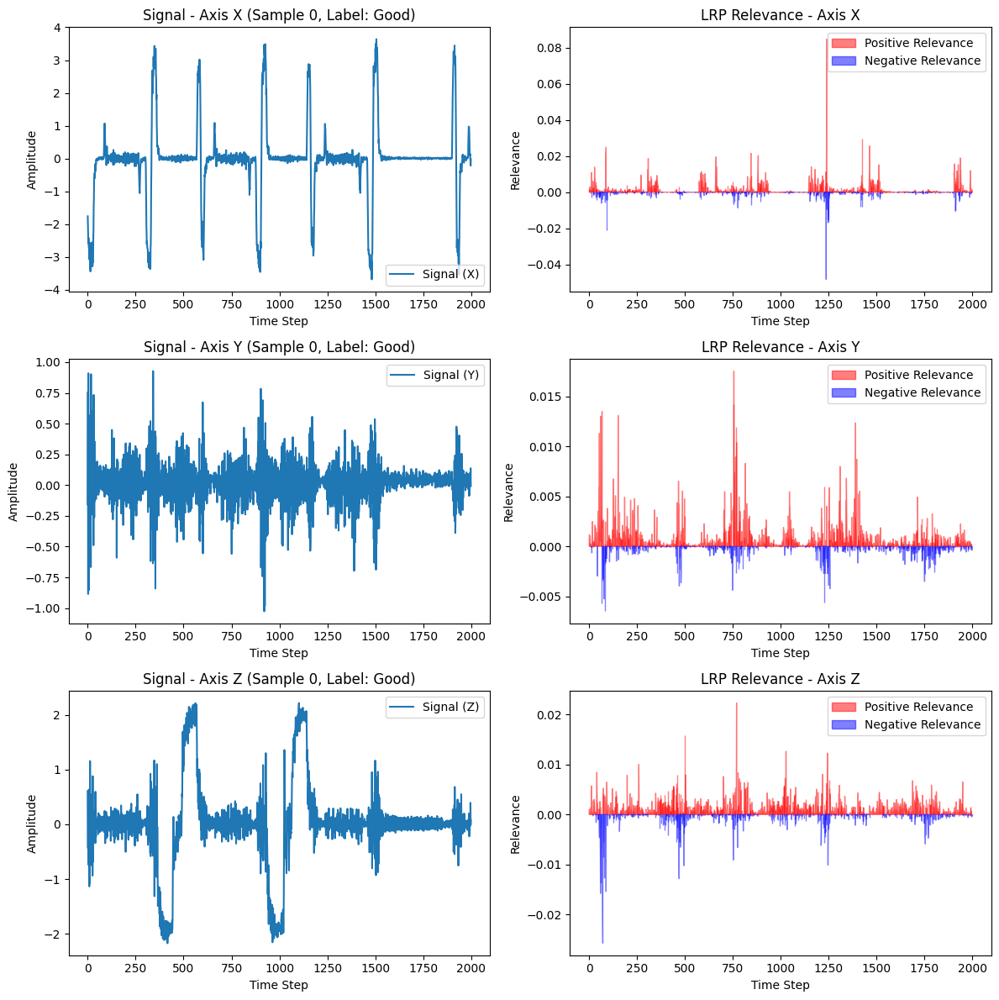

In [77]:
relevance_time, relevance_freq, signal_freq, input_signal, freqs, f_label = compute_dft_lrp_relevance(
    model=best_model,
    sample=sample,  # Shape: (3, 2000) or torch tensor
    label=label,  # Use true label or None for prediction
    device=device
)
print(f"Sample {random_index} Label: {'Good' if f_label == 0 else 'Bad'}")

# Visualize LRP relevances (use your existing `visualize_lrp_relevance_single_sample` function)
visualize_lrp_single_sample(
    signal=input_signal,
    relevance=relevance_time,
    label=f_label)

Sample device: cuda:0
Model device: cuda:0
Target device: cuda:0
Input device in zennit_relevance: cuda:0
Model structure:
  - : CNN1D_DS_Wide
  - conv1: Conv1d
  - gn1: GroupNorm
  - pool1: MaxPool1d
  - conv2: Conv1d
  - gn2: GroupNorm
  - pool2: MaxPool1d
  - conv3: Conv1d
  - gn3: GroupNorm
  - pool3: MaxPool1d
  - global_avg_pool: AdaptiveAvgPool1d
  - fc1: Linear
  - fc2: Linear
  - dropout: Dropout
  - relu: ReLU
Successfully registered hooks
Input device in zennit_relevance_lrp: cuda:0
Model output shape: torch.Size([1, 2])
values shape:torch.Size([1])
Target output shape: (torch.Size([1, 2]), tensor([[4.4548, 0.0000]], device='cuda:0'))
Sample 106 Label: Good


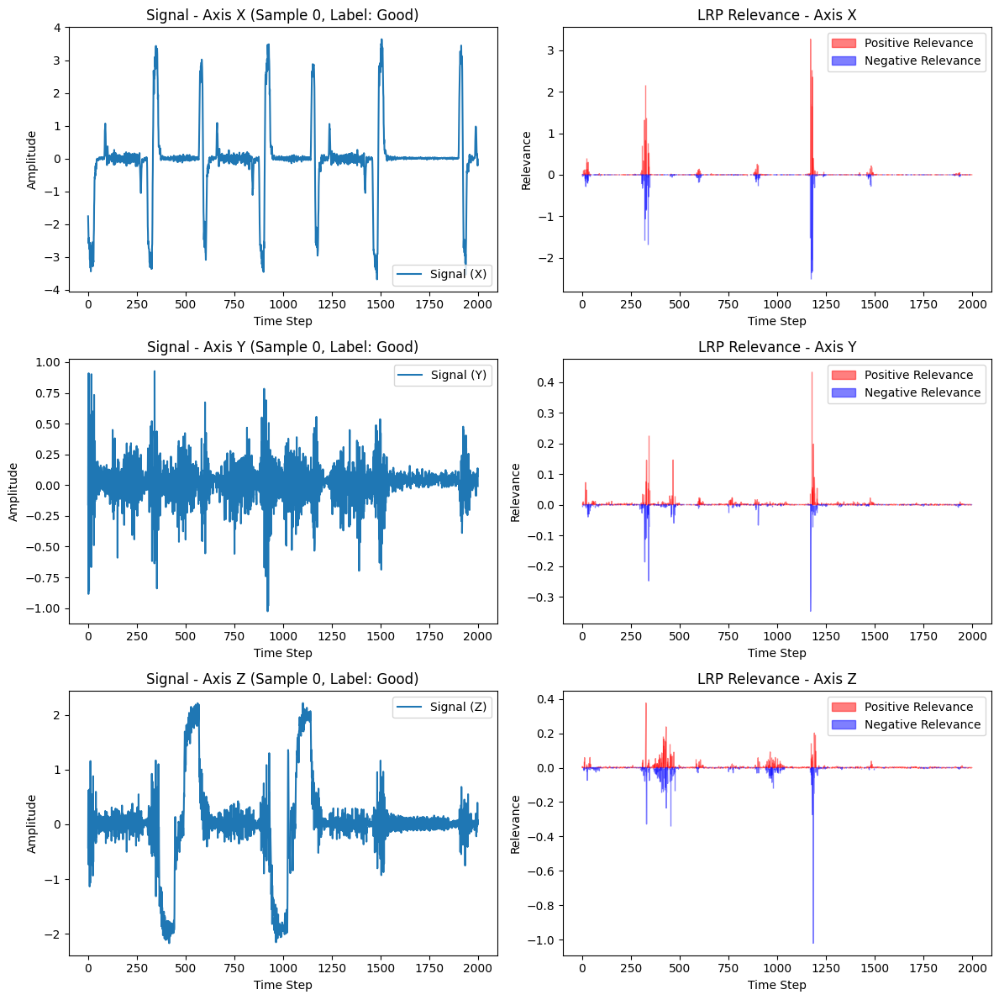

In [78]:
relevance, input_signal, final_label = compute_lrp_relevance(
    model=best_model,
    sample=sample,  # Shape: (3, 10000) or torch tensor
    label=label,  # Use true label or None for prediction
    device=device
)
print(f"Sample {random_index} Label: {'Good' if final_label == 0 else 'Bad'}")

# Visualize LRP relevances (use your existing `visualize_lrp_relevance_single_sample` function)
visualize_lrp_single_sample(
    signal=input_signal,
    relevance=relevance,
    label=final_label)

#### DFT-LRP implementation

In [110]:
#Multi-axis representation calculation of lrp in all axis
relevance_time, relevance_freq, signal_freq, input_signal, freqs, predicted_label = compute_dft_lrp_relevance_once(
        model=best_model,
        sample=sample.cpu().detach().numpy(),  # Convert to NumPy for DFTLRP
        label=label.item(),
        device=device,
        signal_length=2000,   #10000 if we did not downsample
        sampling_rate=400  # Placeholder, replace with your actual sampling rate     #2000 if we did not downsample
    )

Input device in zennit_relevance: cuda:0
Model structure:
  - : CNN1D_DS_Wide
  - conv1: Conv1d
  - gn1: GroupNorm
  - pool1: MaxPool1d
  - conv2: Conv1d
  - gn2: GroupNorm
  - pool2: MaxPool1d
  - conv3: Conv1d
  - gn3: GroupNorm
  - pool3: MaxPool1d
  - global_avg_pool: AdaptiveAvgPool1d
  - fc1: Linear
  - fc2: Linear
  - dropout: Dropout
  - relu: ReLU
Successfully registered hooks
Input device in zennit_relevance_lrp: cuda:0
Model output shape: torch.Size([1, 2])
values shape:torch.Size([1])
Target output shape: (torch.Size([1, 2]), tensor([[4.4548, 0.0000]], device='cuda:0'))
Input sample shape: torch.Size([1, 3, 2000])
Relevance time shape: (3, 2000)
Input signal shape: (3, 2000)
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch

Min relevance: -0.012628604657948017, Max relevance: 0.02587079629302025
 Maximum Absolute Attribution in Axis 0: 0.02587079629302025
 Maximum Absolute Attribution in Axis 1: 0.012728794477880001
 Maximum Absolute Attribution in Axis 2: 0.011709085665643215


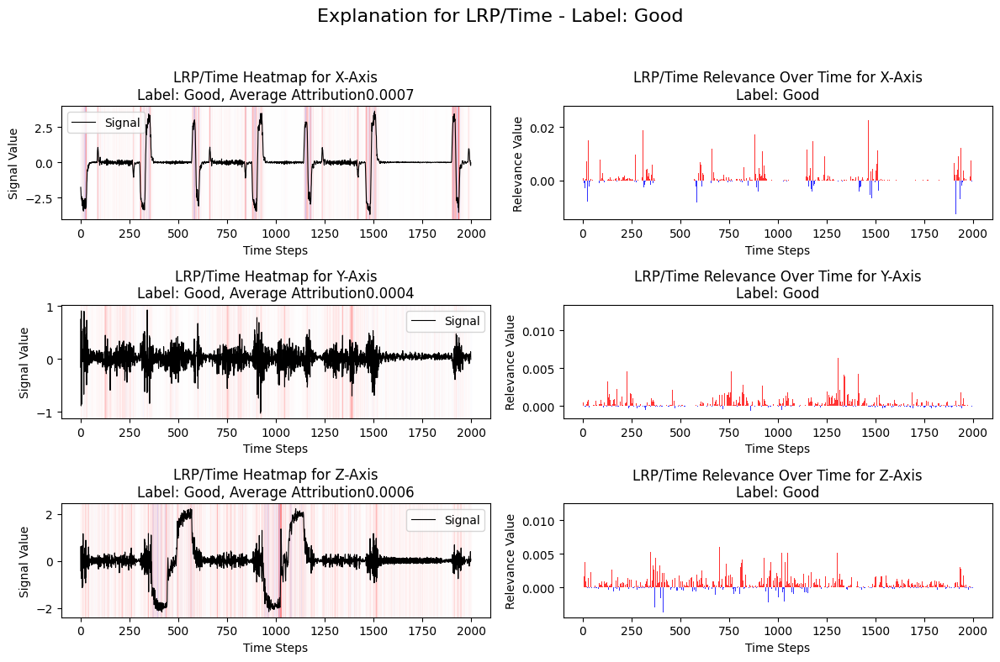

In [111]:
#Multi-axis representation
# LRP visualization with mutual visualization function
print(f"Min relevance: {np.min(relevance_time)}, Max relevance: {np.max(relevance_time)}")
visualize_with_label_attribution(sample, relevance_time, label, "LRP/Time")


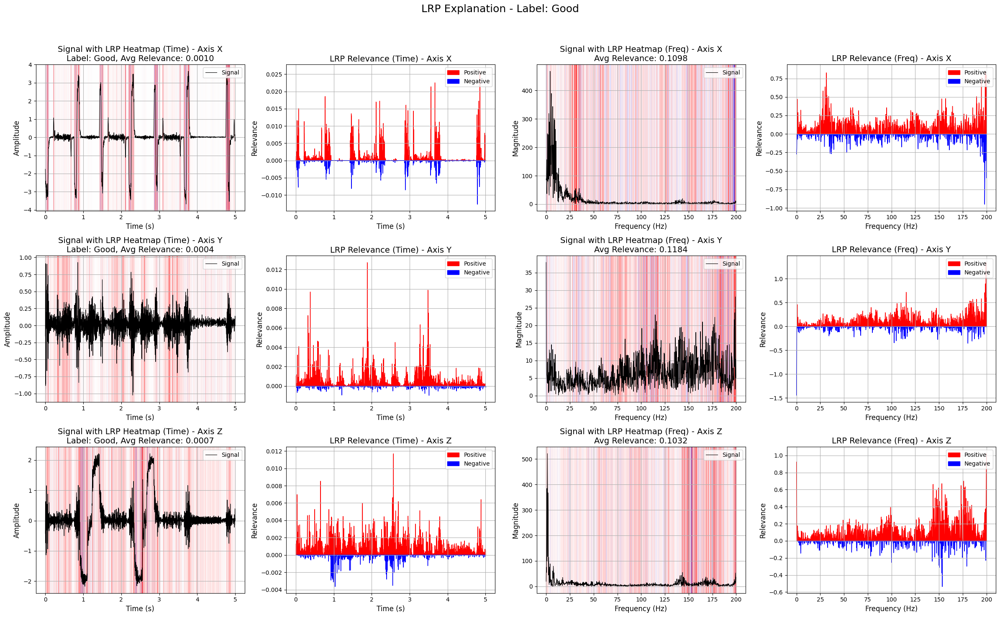

In [112]:
#Multi-axis representation
# Visualize the results
visualize_lrp_dft(
        relevance_time=relevance_time,
        relevance_freq=relevance_freq,
        signal_freq=signal_freq,
        input_signal=input_signal,
        freqs=freqs,
        predicted_label=predicted_label,
        k_max=200,  # Plot up to 1000 Hz
        sampling_rate=400  # Placeholder, replace with your actual sampling rate
    )

In [117]:
#Multi-axis representation separate calculation of lrp in each axis
relevance_time, relevance_freq, signal_freq, input_signal, freqs, predicted_label = compute_dft_lrp_relevance(
        model=best_model,
        sample=sample.cpu().detach().numpy(),  # Convert to NumPy for DFTLRP
        label=label.item(),
        device=device,
        signal_length=2000,   #10000 if we did not downsample
        sampling_rate=400  # Placeholder, replace with your actual sampling rate     #2000 if we did not downsample
    )

Input device in zennit_relevance: cuda:0
Model structure:
  - : CNN1D_DS_Wide
  - conv1: Conv1d
  - gn1: GroupNorm
  - pool1: MaxPool1d
  - conv2: Conv1d
  - gn2: GroupNorm
  - pool2: MaxPool1d
  - conv3: Conv1d
  - gn3: GroupNorm
  - pool3: MaxPool1d
  - global_avg_pool: AdaptiveAvgPool1d
  - fc1: Linear
  - fc2: Linear
  - dropout: Dropout
  - relu: ReLU
Successfully registered hooks
Input device in zennit_relevance_lrp: cuda:0
Model output shape: torch.Size([1, 2])
values shape:torch.Size([1])
Target output shape: (torch.Size([1, 2]), tensor([[4.4548, 0.0000]], device='cuda:0'))
Input sample shape: torch.Size([1, 3, 2000])
Relevance time shape: (3, 2000)
Input signal shape: (3, 2000)
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch

E:\Thesis\Datasets\CNC\utils\dft_lrp.py:124: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input = torch.tensor(input, dtype=dtype)


Min relevance: -0.012628604657948017, Max relevance: 0.025870800018310547
 Maximum Absolute Attribution in Axis 0: 0.025870800018310547
 Maximum Absolute Attribution in Axis 1: 0.012728794477880001
 Maximum Absolute Attribution in Axis 2: 0.011709085665643215


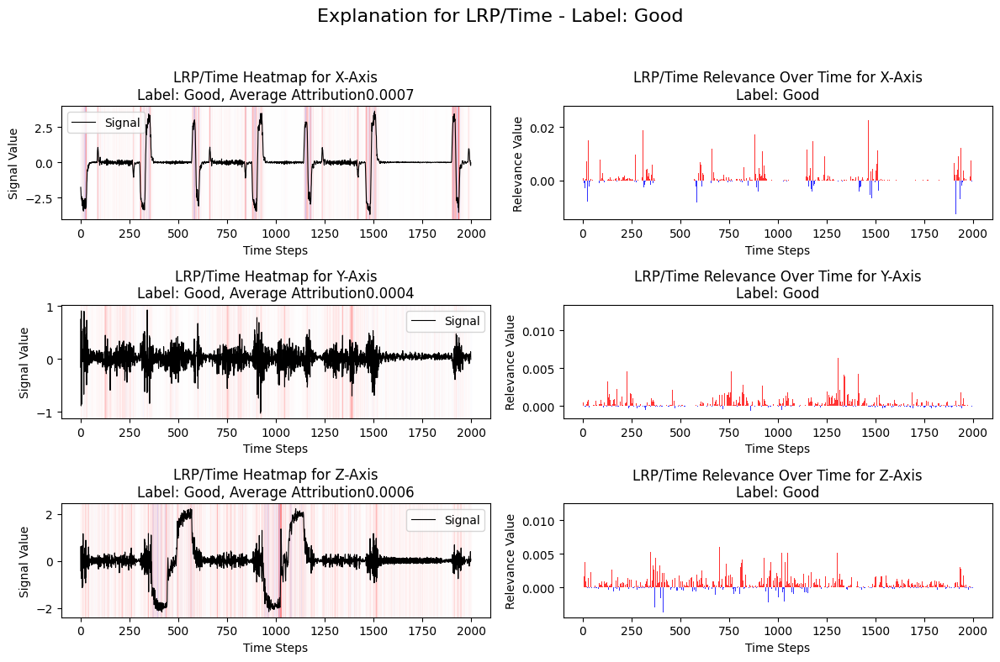

In [118]:
#Multi-axis representation separate calculation of lrp in each axis
# LRP visualization with mutual visualization function
print(f"Min relevance: {np.min(relevance_time)}, Max relevance: {np.max(relevance_time)}")
visualize_with_label_attribution(sample, relevance_time, label, "LRP/Time")


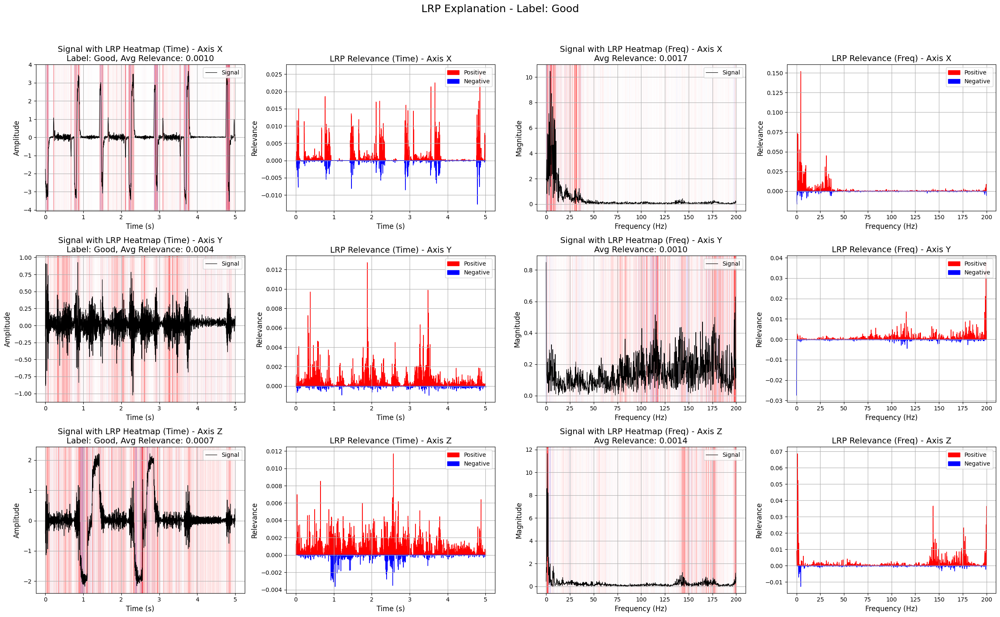

In [120]:
#Multi-axis representation separate calculation of lrp in each axis
# Visualize the results
visualize_lrp_dft(
        relevance_time=relevance_time,
        relevance_freq=relevance_freq,
        signal_freq=signal_freq,
        input_signal=input_signal,
        freqs=freqs,
        predicted_label=predicted_label,
        k_max=200,  # Plot up to 1000 Hz
        sampling_rate=400  # Placeholder, replace with your actual sampling rate
    )

In [121]:
#Multi-axis representation
# Global Attribution over frequency with LRP
summary_lrp_freq = summarize_attributions(relevance_freq)  # Pass your attributions here
# Flatten the summary dictionary and create a DataFrame
data_lrp_freq = []
for axis, values in summary_lrp_freq.items():
    row = {"Axis": axis}
    row.update(values)
    data_lrp_freq.append(row)

# Create the DataFrame
df_summary_lrp_freq = pd.DataFrame(data_lrp_freq)

# Display the DataFrame as a table
print(df_summary_lrp_freq)

     Axis  Positive Count  Total Positive Relevance  \
0  Axis 0             688                  1.549937   
1  Axis 1             760                  0.837707   
2  Axis 2             743                  1.240567   

   Average Positive Relevance  Negative Count  Total Negative Relevance  \
0                    0.002253             313                 -0.199983   
1                    0.001102             241                 -0.120695   
2                    0.001670             258                 -0.143172   

   Average Negative Relevance  Total Relevance (Pos + Neg)  \
0                   -0.000639                     1.349954   
1                   -0.000501                     0.717012   
2                   -0.000555                     1.097395   

   Average Relevance (Pos + Neg)  
0                       0.001349  
1                       0.000716  
2                       0.001096  


In [122]:
#Multi-axis representation
# Global Attribution over frequency with LRP
summary_lrp_t = summarize_attributions(relevance_time)  # Pass your attributions here
# Flatten the summary dictionary and create a DataFrame
data_lrp_t = []
for axis, values in summary_lrp_t.items():
    row = {"Axis": axis}
    row.update(values)
    data_lrp_t.append(row)

# Create the DataFrame
df_summary_lrp_t = pd.DataFrame(data_lrp_t)

# Display the DataFrame as a table
print(df_summary_lrp_t)

     Axis  Positive Count  Total Positive Relevance  \
0  Axis 0            1351                  1.717372   
1  Axis 1            1486                  0.769949   
2  Axis 2            1575                  1.277183   

   Average Positive Relevance  Negative Count  Total Negative Relevance  \
0                    0.001271             649                 -0.365896   
1                    0.000518             514                 -0.052070   
2                    0.000811             425                 -0.129071   

   Average Negative Relevance  Total Relevance (Pos + Neg)  \
0                   -0.000564                     1.351476   
1                   -0.000101                     0.717879   
2                   -0.000304                     1.148113   

   Average Relevance (Pos + Neg)  
0                       0.000676  
1                       0.000359  
2                       0.000574  


In [31]:
# LRP visualization with common visualization function
 # write something similar to the common visualization for the frequency, so the relevance are colored over fft/dft signals
# in compute_dft_lrp_relevance why freqs are calculated by fft not dft?

In [96]:
import gc

# Before calling your function
if torch.cuda.is_available():
    torch.cuda.empty_cache()
gc.collect()


499051

In [97]:
relevance_time_dft, relevance_freq_dft, signal_freq_dft, relevance_timefreq_dft, signal_timefreq_dft, input_signal_dft, freqs_dft, predicted_label_dft = compute_dft_lrp_relevance_with_timefreq(
        model=best_model,
        sample=sample,
        label=None,
        signal_length=2000,
        sampling_rate=400,
        window_shift=128,  # Increased to reduce memory usage
        window_width=256,
        window_shape="rectangle"
    )

Input device in zennit_relevance: cuda:0
Input device in zennit_relevance_lrp: cuda:0
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Input signal shape: (1, 2000)
Input relevance shape: (1, 2000)
Signal hat shape after transform: torch.Size([1, 2000])
Relevance hat shape before multiplication: torch.Size([1, 2000])
Relevance hat shape after multiplication: torch.Size([1, 2000])


E:\Thesis\Datasets\CNC\utils\dft_lrp.py:124: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input = torch.tensor(input, dtype=dtype)


Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Input signal shape: (1, 2000)
Input relevance shape: (1, 2000)
Signal hat shape after transform: torch.Size([1, 2000])
Relevance hat shape before multiplication: torch.Size([1, 2000])
Relevance hat shape after multiplication: torch.Size([1, 2000])
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weigh

In [98]:
import gc

# Before calling your function
if torch.cuda.is_available():
    torch.cuda.empty_cache()
gc.collect()


0

Error plotting time-frequency data for axis 0: too many indices for array: array is 2-dimensional, but 3 were indexed
Error plotting time-frequency data for axis 1: too many indices for array: array is 2-dimensional, but 3 were indexed
Error plotting time-frequency data for axis 2: too many indices for array: array is 2-dimensional, but 3 were indexed


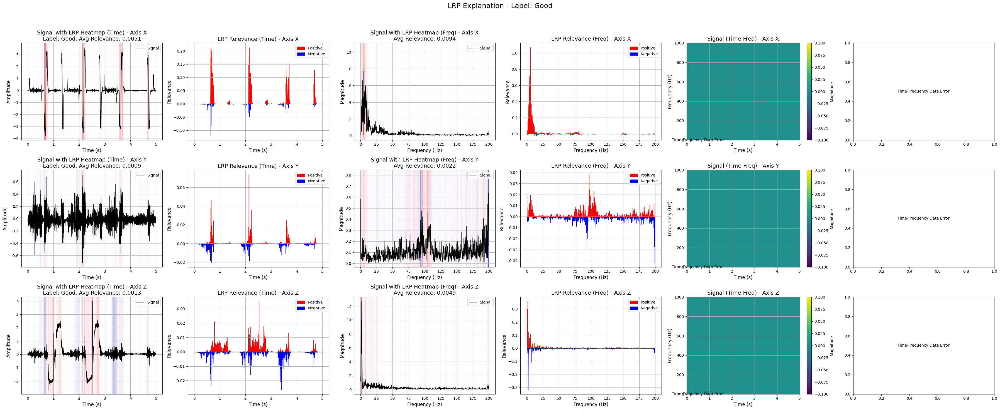

In [99]:
# Visualize the results
visualize_lrp_dft_extended(
        relevance_time=relevance_time_dft,
        relevance_freq=relevance_freq_dft,
        signal_freq=signal_freq_dft,
        relevance_timefreq=relevance_freq_dft,
        signal_timefreq=signal_timefreq_dft,
        input_signal=input_signal_dft,
        freqs=freqs_dft,
        predicted_label=predicted_label_dft,
        k_max=1000,  # Plot up to 1000 Hz
        sampling_rate=400  # Placeholder, replace with your actual sampling rate
    )

#### FFT-LRP implementation

In [100]:
relevance_time_fft, relevance_freq_fft, signal_freq_fft, relevance_timefreq_fft, signal_timefreq_fft, input_signal_fft, freqs_fft, predicted_label_fft = compute_fft_lrp_relevance(
        model=best_model,
        sample=sample,
        label=None,
        signal_length=2000,
        sampling_rate=400,
        compute_timefreq=True,
        window_shift=64,  # Increased to reduce memory usage
        window_width=128,
        window_shape="rectangle"
    )

Input sample shape: torch.Size([1, 3, 2000])
Target label: 0
Input device in zennit_relevance: cuda:0
Input device in zennit_relevance_lrp: cuda:0
relevance_time_tensor shape before squeeze: (1, 3, 2000)
relevance_time shape after squeeze: (3, 2000)
input_signal shape: (3, 2000)
fft_lrp: Input relevance shape = (1, 2000), signal shape = (1, 2000)
fft_lrp: relevance_tensor shape = torch.Size([1, 2000]), signal_tensor shape = torch.Size([1, 2000])
fourier_transform: signal_tensor shape = torch.Size([1, 2000])
fourier_transform (FFT): signal_hat shape = torch.Size([1, 1001])
fft_lrp: signal_hat shape = torch.Size([1, 1001])
fft_lrp: relevance_normed shape = torch.Size([1, 2000])
fft_lrp: relevance_fft real part = tensor([[ 0.0034,  0.0135,  0.0049,  ...,  0.0156,  0.0188, -0.0052]],
       device='cuda:0')
fft_lrp: relevance_fft imag part = tensor([[ 0.0000,  0.0109,  0.0157,  ..., -0.0106,  0.0047,  0.0000]],
       device='cuda:0')
fft_lrp: relevance_hat real part before cpu = tensor([[

In [101]:
# Global Attribution for FFT_LRP over frequency
summary_fft_freq = summarize_attributions(relevance_freq_fft)  # Pass your attributions here
# Flatten the summary dictionary and create a DataFrame
data_fft_freq = []
for axis, values in summary_fft_freq.items():
    row = {"Axis": axis}
    row.update(values)
    data_fft_freq.append(row)

# Create the DataFrame
df_summary_fft_freq = pd.DataFrame(data_fft_freq)

# Display the DataFrame as a table
print(df_summary_fft_freq)

     Axis  Positive Count  Total Positive Relevance  \
0  Axis 0             563        3.989094+0.000000j   
1  Axis 1             502        4.586784+0.000000j   
2  Axis 2             438        2.402157+0.000000j   

   Average Positive Relevance  Negative Count  Total Negative Relevance  \
0          0.007085+0.000000j             438       -2.323455+0.000000j   
1          0.009137+0.000000j             499       -4.032140+0.000000j   
2          0.005484+0.000000j             563       -3.320024+0.000000j   

   Average Negative Relevance  Total Relevance (Pos + Neg)  \
0         -0.005305+0.000000j           1.665639+0.000000j   
1         -0.008080+0.000000j           0.554644+0.000000j   
2         -0.005897+0.000000j          -0.917867+0.000000j   

   Average Relevance (Pos + Neg)  
0             0.001664+0.000000j  
1             0.000554+0.000000j  
2            -0.000917+0.000000j  


In [102]:
# Global Attribution for FFT_LRP over time frequency
summary_fft_timefreq = summarize_attributions(relevance_timefreq_fft)  # Pass your attributions here
# Flatten the summary dictionary and create a DataFrame
data_fft_timefreq = []
for axis, values in summary_fft_timefreq.items():
    row = {"Axis": axis}
    row.update(values)
    data_fft_timefreq.append(row)

# Create the DataFrame
df_summary_fft_timefreq = pd.DataFrame(data_fft_timefreq)

# Display the DataFrame as a table
print(df_summary_fft_timefreq)

     Axis  Positive Count  Total Positive Relevance  \
0  Axis 0           10714      14.249589+ 0.000000j   
1  Axis 1           10867      15.753419+ 0.000000j   
2  Axis 2           10581       8.290801+ 0.000000j   

   Average Positive Relevance  Negative Count  Total Negative Relevance  \
0          0.001330+0.000000j            9306      -8.151214+ 0.000000j   
1          0.001450+0.000000j            9153     -13.573017+ 0.000000j   
2          0.000784+0.000000j            9439     -11.993959+ 0.000000j   

   Average Negative Relevance  Total Relevance (Pos + Neg)  \
0         -0.000876+0.000000j           6.098375+0.000000j   
1         -0.001483+0.000000j           2.180402+0.000000j   
2         -0.001271+0.000000j          -3.703159+0.000000j   

   Average Relevance (Pos + Neg)  
0             0.000305+0.000000j  
1             0.000109+0.000000j  
2            -0.000185+0.000000j  


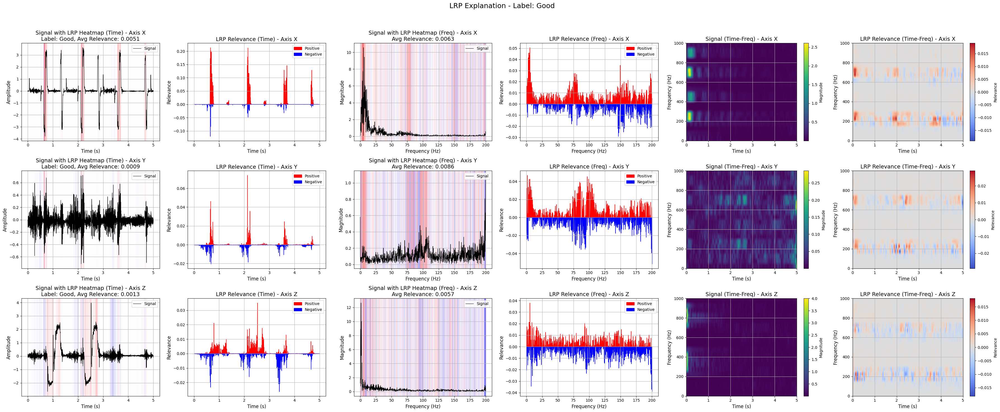

In [103]:
# Visualize
visualize_lrp_fft(
    relevance_time=relevance_time_fft,
    relevance_freq=relevance_freq_fft,
    signal_freq=signal_freq_fft,
    relevance_timefreq=relevance_timefreq_fft,
    signal_timefreq=signal_timefreq_fft,
    input_signal=input_signal_fft,
    freqs=freqs_fft,
    predicted_label=predicted_label_fft,
    signal_length=2000,
    sampling_rate=400,
    k_max=1000
)

Min relevance: -1.386168360710144, Max relevance: 2.237823486328125
 Maximum Absolute Attribution in Axis 0: 2.237823486328125
 Maximum Absolute Attribution in Axis 1: 0.5601271986961365
 Maximum Absolute Attribution in Axis 2: 0.717510461807251


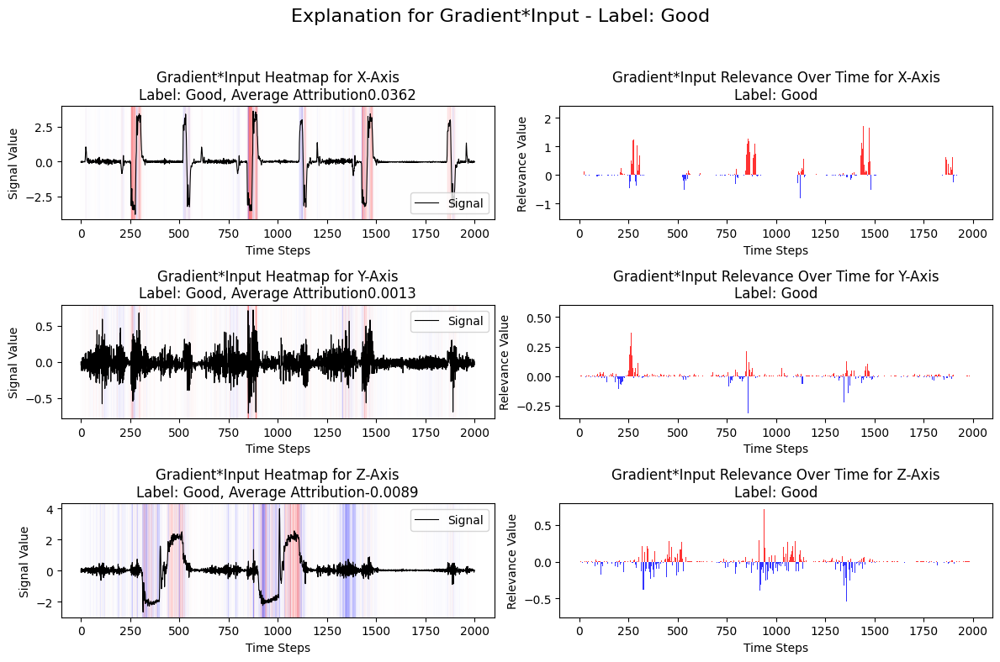

In [104]:
# Grad*Input
grad_input_attr, _ = grad_times_input_relevance(best_model, sample)

print(f"Min relevance: {np.min(grad_input_attr.detach().cpu().numpy())}, Max relevance: {np.max(grad_input_attr.detach().cpu().numpy())}")
visualize_with_label_attribution(sample, grad_input_attr, label, "Gradient*Input")


In [105]:
# Example usage
summary_g = summarize_attributions(grad_input_attr.detach().cpu().numpy())  # Pass your attributions here
# Flatten the summary dictionary and create a DataFrame
data_g = []
for axis, values in summary_g.items():
    row = {"Axis": axis}
    row.update(values)
    data_g.append(row)

# Create the DataFrame
df_summary_g = pd.DataFrame(data_g)

# Display the DataFrame as a table
print(df_summary_g)

     Axis  Positive Count  Total Positive Relevance  \
0  Axis 0            1007                110.149658   
1  Axis 1            1038                 16.254581   
2  Axis 2             900                 33.494713   

   Average Positive Relevance  Negative Count  Total Negative Relevance  \
0                    0.109384             993                -37.737312   
1                    0.015660             962                -13.679686   
2                    0.037216            1100                -51.274395   

   Average Negative Relevance  Total Relevance (Pos + Neg)  \
0                   -0.038003                    72.412346   
1                   -0.014220                     2.574896   
2                   -0.046613                   -17.779682   

   Average Relevance (Pos + Neg)  
0                       0.036206  
1                       0.001287  
2                      -0.008890  


Min relevance: -0.14111274480819702, Max relevance: 0.06736332923173904
 Maximum Absolute Attribution in Axis 0: 0.14111274480819702
 Maximum Absolute Attribution in Axis 1: 0.023390358313918114
 Maximum Absolute Attribution in Axis 2: 0.07321435958147049


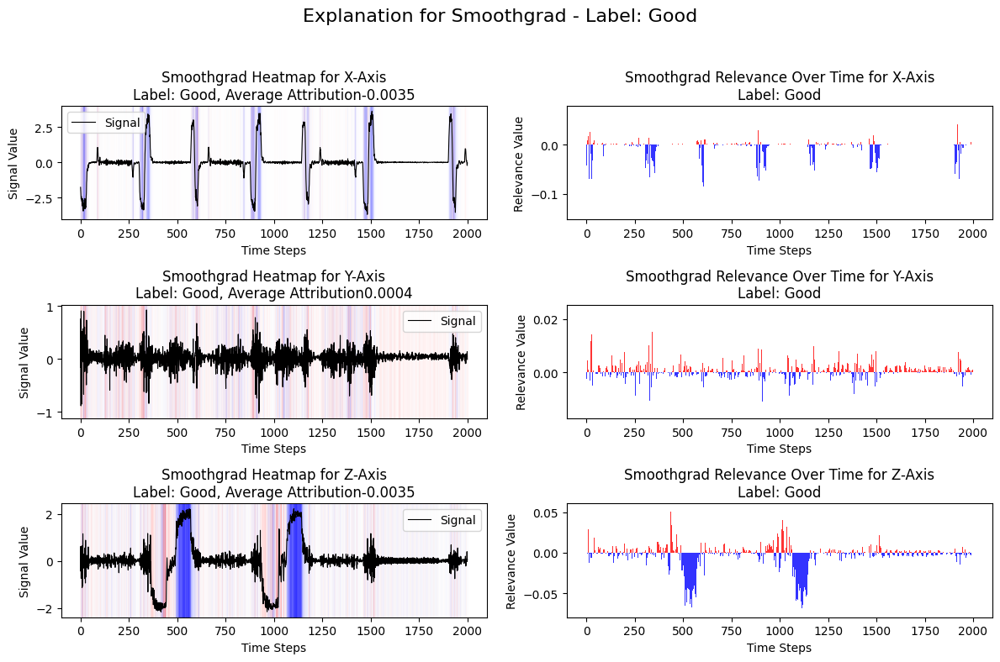

In [123]:

# SmoothGrad
smoothgrad_attr, _ = smoothgrad_relevance(best_model, sample)
print(f"Min relevance: {np.min(smoothgrad_attr.detach().cpu().numpy())}, Max relevance: {np.max(smoothgrad_attr.detach().cpu().numpy())}")
visualize_with_label_attribution(sample, smoothgrad_attr, label, "Smoothgrad")


Min relevance: -0.019002914428710938, Max relevance: 0.0704946517944336
 Maximum Absolute Attribution in Axis 0: 0.0704946517944336
 Maximum Absolute Attribution in Axis 1: 0.005051612854003906
 Maximum Absolute Attribution in Axis 2: 0.019002914428710938


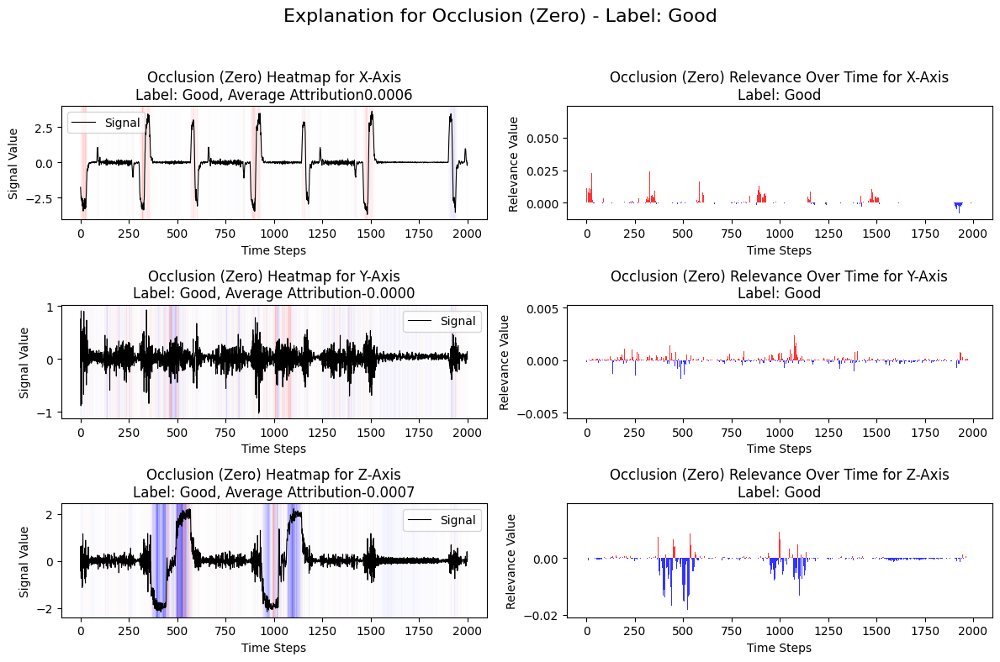

In [124]:
# Occlusion (zero-based occlusion)
occlusion_attr_zero, _ = occlusion_signal_relevance(best_model, sample, occlusion_type="zero")
print(f"Min relevance: {np.min(occlusion_attr_zero.detach().cpu().numpy())}, Max relevance: {np.max(occlusion_attr_zero.detach().cpu().numpy())}")
visualize_with_label_attribution(sample, occlusion_attr_zero, label, "Occlusion (Zero)")


Min relevance: -0.05149030685424805, Max relevance: 0.017648696899414062
 Maximum Absolute Attribution in Axis 0: 0.05149030685424805
 Maximum Absolute Attribution in Axis 1: 0.05149030685424805
 Maximum Absolute Attribution in Axis 2: 0.05149030685424805


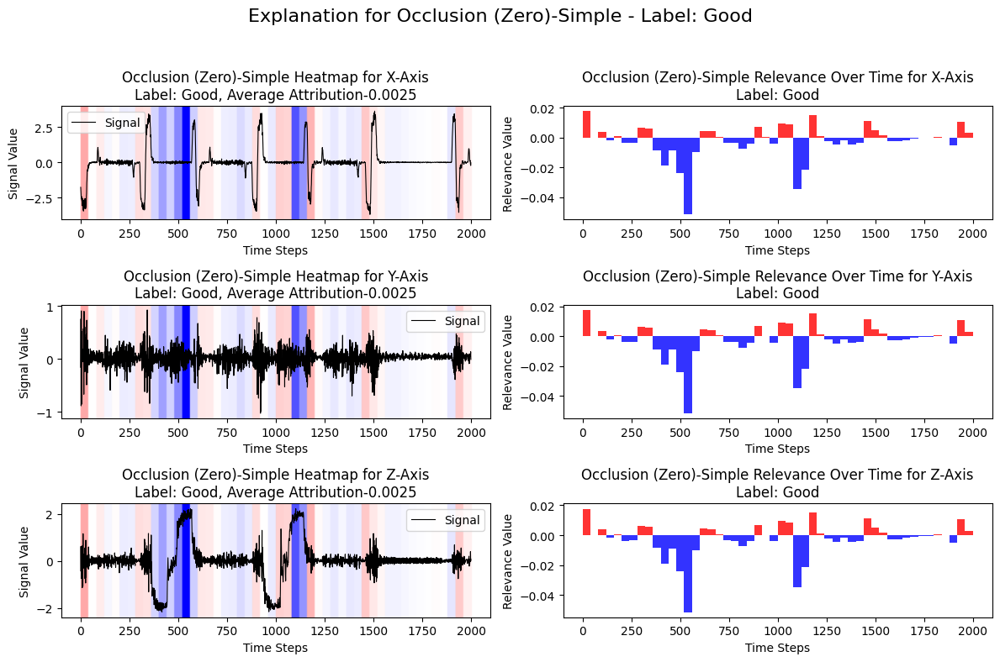

In [125]:
# Occlusion (zero-based occlusion)
occlusion_attr_zero_simple, _ = occlusion_simpler_relevance(best_model, sample, occlusion_type="zero")
print(f"Min relevance: {np.min(occlusion_attr_zero_simple.detach().cpu().numpy())}, Max relevance: {np.max(occlusion_attr_zero_simple.detach().cpu().numpy())}")
visualize_with_label_attribution(sample, occlusion_attr_zero_simple, label, "Occlusion (Zero)-Simple")


Min relevance: -0.02812671661376953, Max relevance: 0.05360698699951172
 Maximum Absolute Attribution in Axis 0: 0.05360698699951172
 Maximum Absolute Attribution in Axis 1: 0.05360698699951172
 Maximum Absolute Attribution in Axis 2: 0.05360698699951172


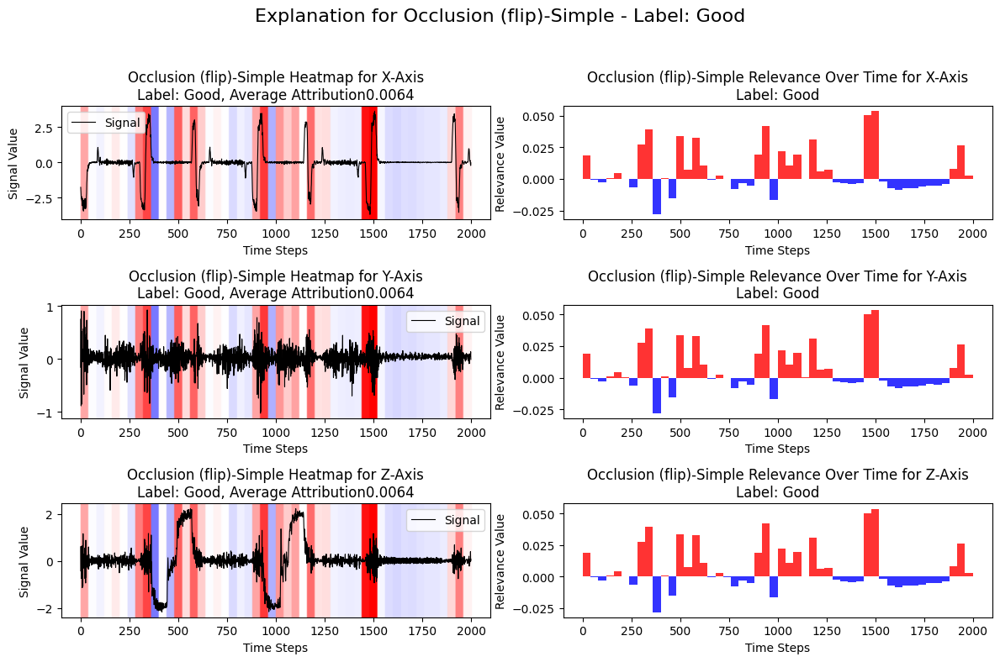

In [126]:
# Occlusion (zero-based occlusion)
occlusion_attr_zero_simple, _ = occlusion_simpler_relevance(best_model, sample, occlusion_type="flip")
print(f"Min relevance: {np.min(occlusion_attr_zero_simple.detach().cpu().numpy())}, Max relevance: {np.max(occlusion_attr_zero_simple.detach().cpu().numpy())}")
visualize_with_label_attribution(sample, occlusion_attr_zero_simple, label, "Occlusion (flip)-Simple")


Min relevance: -0.024231433868408203, Max relevance: 0.11638975143432617
 Maximum Absolute Attribution in Axis 0: 0.11638975143432617
 Maximum Absolute Attribution in Axis 1: 0.014496326446533203
 Maximum Absolute Attribution in Axis 2: 0.0279541015625


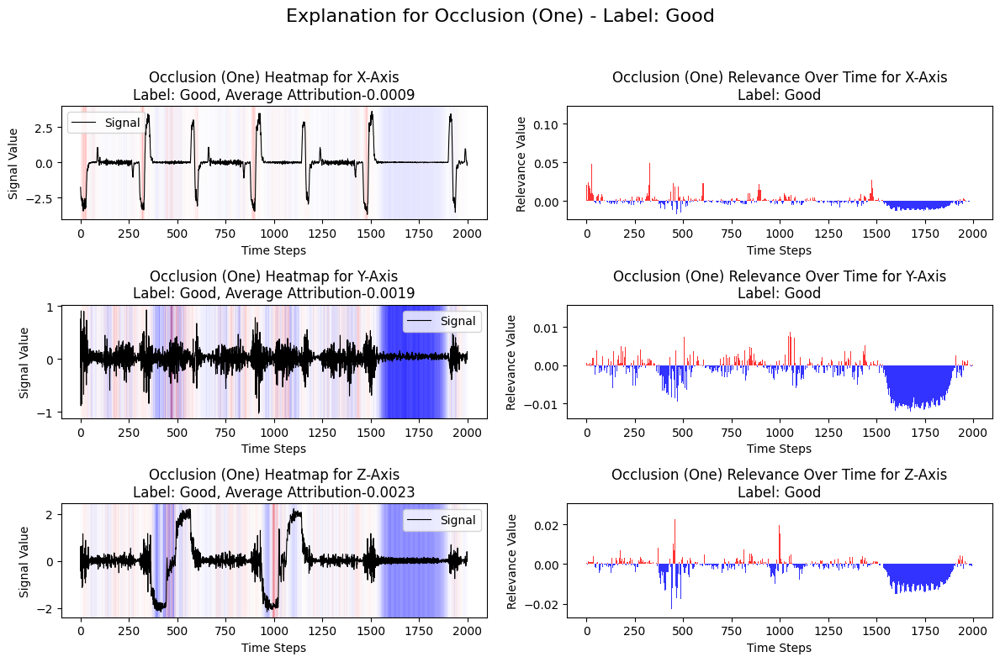

In [127]:
# Occlusion (one occlusion)
occlusion_attr_one, _ = occlusion_signal_relevance(best_model, sample, occlusion_type="one")
print(f"Min relevance: {np.min(occlusion_attr_one.detach().cpu().numpy())}, Max relevance: {np.max(occlusion_attr_one.detach().cpu().numpy())}")
visualize_with_label_attribution(sample, occlusion_attr_one, label, "Occlusion (One)")


Min relevance: -0.029549598693847656, Max relevance: 0.031189441680908203
 Maximum Absolute Attribution in Axis 0: 0.031189441680908203
 Maximum Absolute Attribution in Axis 1: 0.01912975311279297
 Maximum Absolute Attribution in Axis 2: 0.029549598693847656


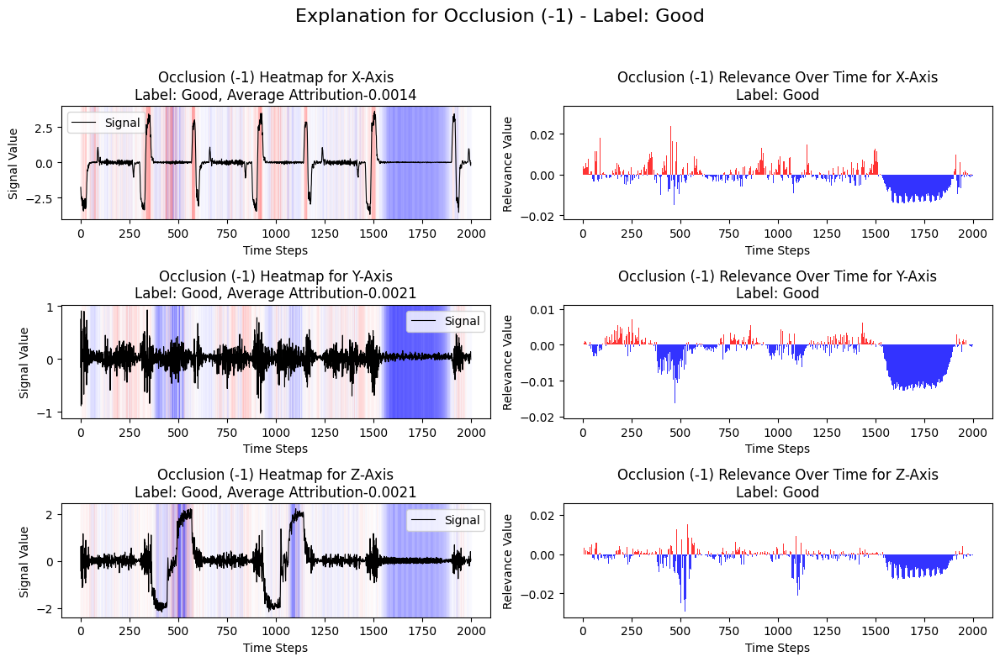

In [128]:
# Occlusion (-one occlusion)
occlusion_attr_mone, _ = occlusion_signal_relevance(best_model, sample, occlusion_type="mone")
print(f"Min relevance: {np.min(occlusion_attr_mone.detach().cpu().numpy())}, Max relevance: {np.max(occlusion_attr_mone.detach().cpu().numpy())}")
visualize_with_label_attribution(sample, occlusion_attr_mone, label, "Occlusion (-1)")


Min relevance: -0.03680133819580078, Max relevance: 0.23772621154785156
 Maximum Absolute Attribution in Axis 0: 0.23772621154785156
 Maximum Absolute Attribution in Axis 1: 0.009682655334472656
 Maximum Absolute Attribution in Axis 2: 0.04077625274658203


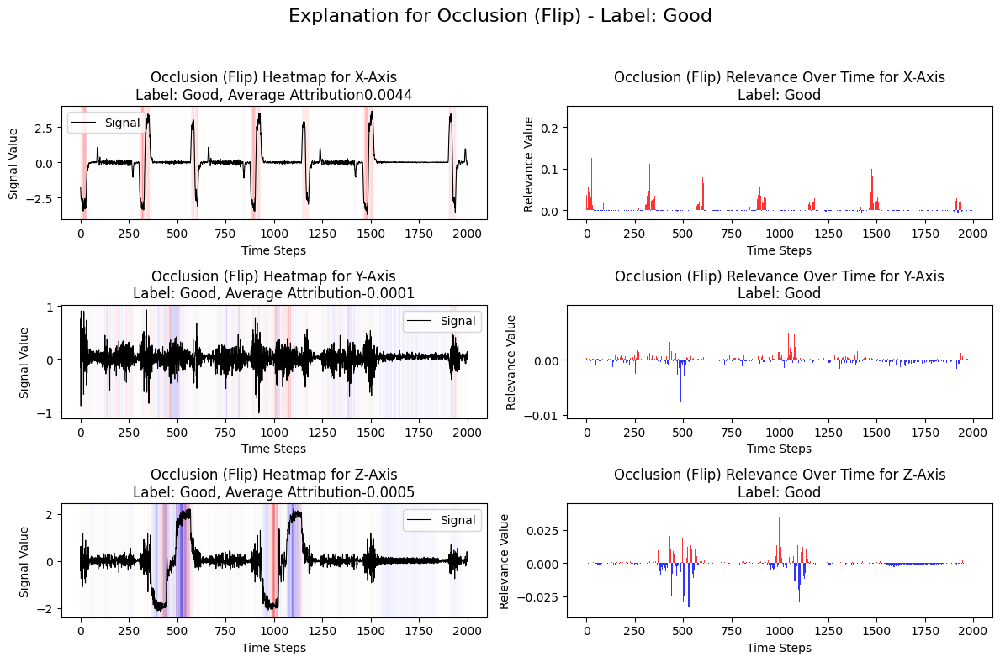

In [129]:
# Occlusion (flip occlusion)
occlusion_attr_flip, _ = occlusion_signal_relevance(best_model, sample, occlusion_type="flip")
print(f"Min relevance: {np.min(occlusion_attr_flip.detach().cpu().numpy())}, Max relevance: {np.max(occlusion_attr_flip.detach().cpu().numpy())}")

visualize_with_label_attribution(sample, occlusion_attr_flip, label, "Occlusion (Flip)")


In [141]:
# Load a Bad sample

# Load a batch
sample_batch, label_batch = next(iter(train_loader))

random.seed(102)
# Choose a random index
random_index_b = random.randint(0, len(sample_batch) - 1)

# Select the random sample and its corresponding label
sample_b = sample_batch[random_index_b]  # Shape: (3, 10000)
label_b = label_batch[random_index_b]    # Shape: ()



sample_b = sample_b.to(device)
label_b = label_b.to(device)

_, predicted_label_b = predict_single(best_model, sample_b)


# Print the selected sample and label
print(f"Random Index: {random_index_b}, Predicted_label:{predicted_label_b}, True_label:{label_b}")
print(sample_b,sample_b.shape)


Random Index: 37, Predicted_label:1, True_label:1
tensor([[ 0.0288,  0.1374,  0.3795,  ...,  0.0244,  0.1252, -0.0423],
        [ 0.2946, -0.2305,  0.1963,  ..., -0.2881,  0.2272,  0.1584],
        [-0.1055, -0.0440, -0.0565,  ..., -0.9966, -0.3952, -1.6188]],
       device='cuda:0') torch.Size([3, 2000])


Sample device: cuda:0
Model device: cuda:0
Target device: cuda:0
Input device in zennit_relevance: cuda:0
Model structure:
  - : CNN1D_DS_Wide
  - conv1: Conv1d
  - gn1: GroupNorm
  - pool1: MaxPool1d
  - conv2: Conv1d
  - gn2: GroupNorm
  - pool2: MaxPool1d
  - conv3: Conv1d
  - gn3: GroupNorm
  - pool3: MaxPool1d
  - global_avg_pool: AdaptiveAvgPool1d
  - fc1: Linear
  - fc2: Linear
  - dropout: Dropout
  - relu: ReLU
Successfully registered hooks
Input device in zennit_relevance_lrp: cuda:0
Model output shape: torch.Size([1, 2])
values shape:torch.Size([1])
Target output shape: (torch.Size([1, 2]), tensor([[0.0000, 3.6267]], device='cuda:0'))
Sample 106 Label: Bad


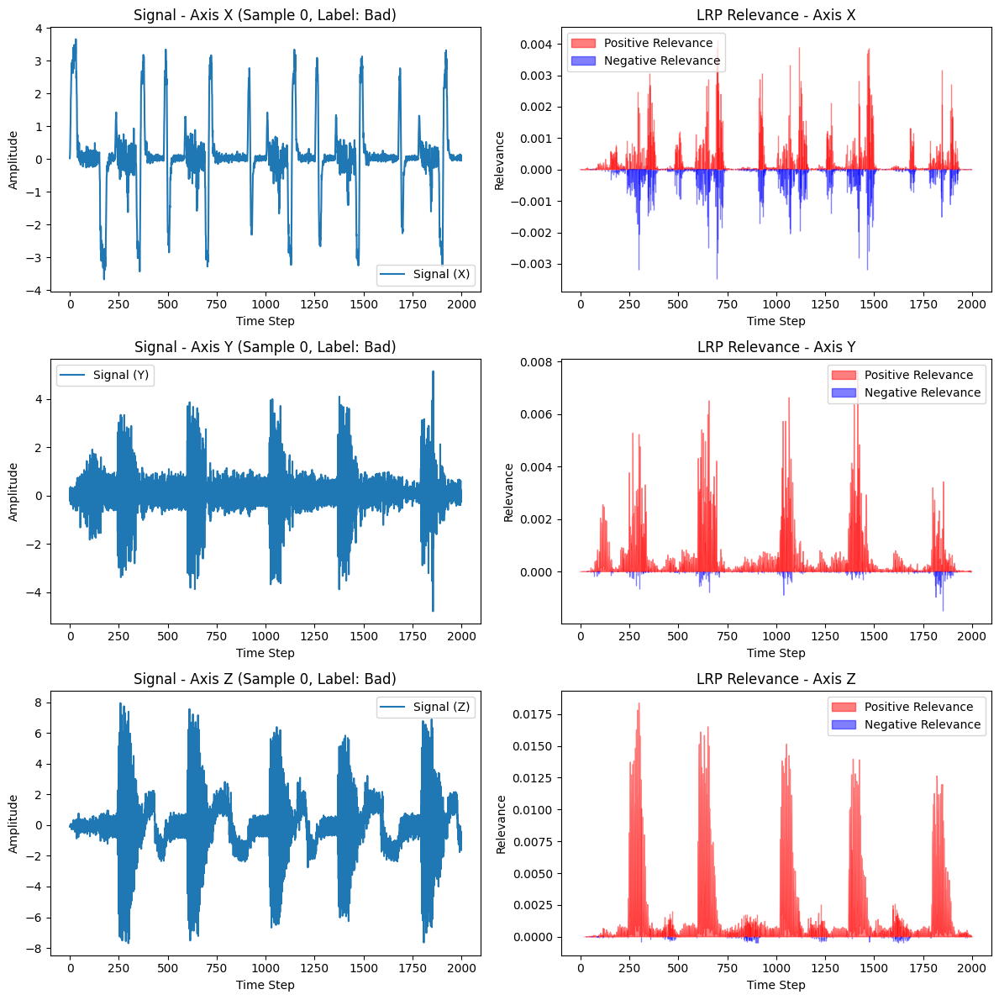

In [142]:
relevance_b, input_signal_b, final_label_b = compute_lrp_relevance(
    model=best_model,
    sample=sample_b,  # Shape: (3, 10000) or torch tensor
    label=label_b,  # Use true label or None for prediction
    device=device
)
print(f"Sample {random_index} Label: {'Good' if final_label_b == 0 else 'Bad'}")

# Visualize LRP relevances (use your existing `visualize_lrp_relevance_single_sample` function)
visualize_lrp_single_sample(
    signal=input_signal_b,
    relevance=relevance_b,
    label=final_label_b)

Min relevance: -0.0034948696848005056, Max relevance: 0.018362779170274734
 Maximum Absolute Attribution in Axis 0: 0.004149221815168858
 Maximum Absolute Attribution in Axis 1: 0.007636905647814274
 Maximum Absolute Attribution in Axis 2: 0.018362779170274734


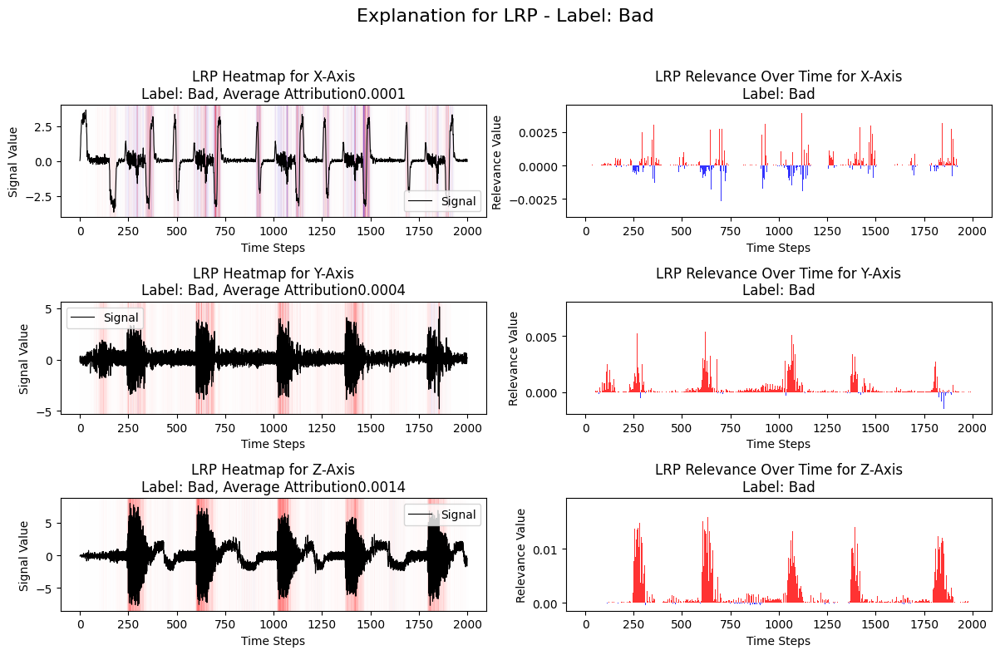

In [143]:

print(f"Min relevance: {np.min(relevance_b)}, Max relevance: {np.max(relevance_b)}")
visualize_with_label_attribution(sample_b, relevance_b, label_b, "LRP")


Min relevance: -0.049850549548864365, Max relevance: 0.04677676409482956
 Maximum Absolute Attribution in Axis 0: 0.049850549548864365
 Maximum Absolute Attribution in Axis 1: 0.022063471376895905
 Maximum Absolute Attribution in Axis 2: 0.041644446551799774


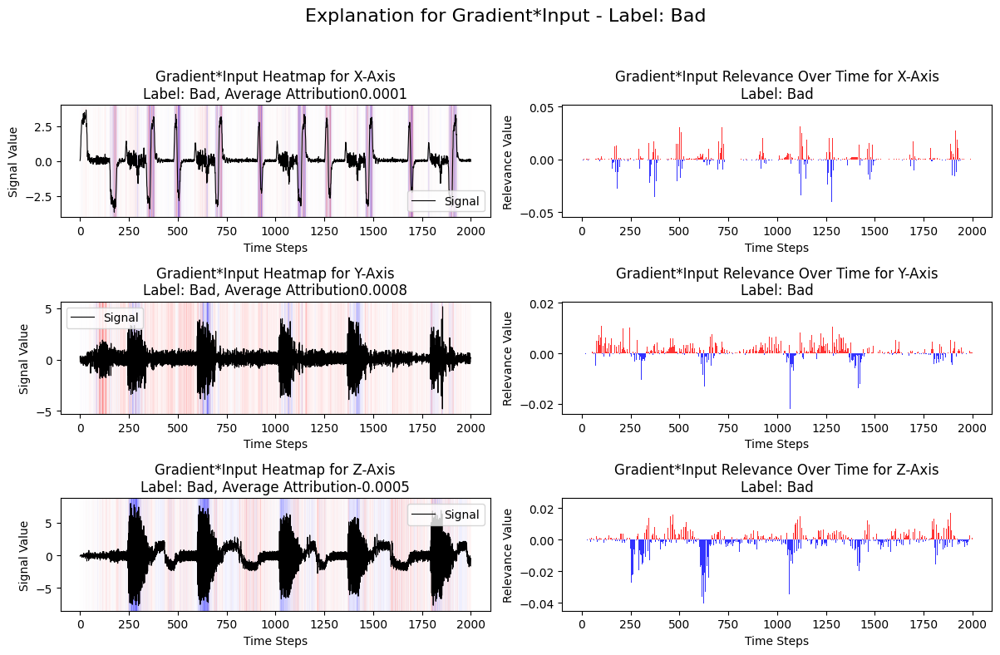

In [144]:
# Grad*Input
grad_input_attr_b, _ = grad_times_input_relevance(best_model, sample_b)
print(f"Min relevance: {np.min(grad_input_attr_b.detach().cpu().numpy())}, Max relevance: {np.max(grad_input_attr_b.detach().cpu().numpy())}")
visualize_with_label_attribution(sample_b, grad_input_attr_b, label_b, "Gradient*Input")

In [145]:
# Example usage
summary_b_g = summarize_attributions(grad_input_attr_b.detach().cpu().numpy())  # Pass your attributions here

# Flatten the summary dictionary and create a DataFrame
data_b_g = []
for axis, values in summary_b_g.items():
    row = {"Axis": axis}
    row.update(values)
    data_b_g.append(row)

# Create the DataFrame
df_summary_b_g = pd.DataFrame(data_b_g)

# Display the DataFrame as a table
print(df_summary_b_g)


     Axis  Positive Count  Total Positive Relevance  \
0  Axis 0            1105                  3.365332   
1  Axis 1            1386                  2.661403   
2  Axis 2            1005                  3.197844   

   Average Positive Relevance  Negative Count  Total Negative Relevance  \
0                    0.003046             895                 -3.257235   
1                    0.001920             614                 -1.020596   
2                    0.003182             995                 -4.186694   

   Average Negative Relevance  Total Relevance (Pos + Neg)  \
0                   -0.003639                     0.108097   
1                   -0.001662                     1.640807   
2                   -0.004208                    -0.988850   

   Average Relevance (Pos + Neg)  
0                       0.000054  
1                       0.000820  
2                      -0.000494  


Min relevance: -0.040430519729852676, Max relevance: 0.01780702732503414
 Maximum Absolute Attribution in Axis 0: 0.01780702732503414
 Maximum Absolute Attribution in Axis 1: 0.02329675853252411
 Maximum Absolute Attribution in Axis 2: 0.040430519729852676


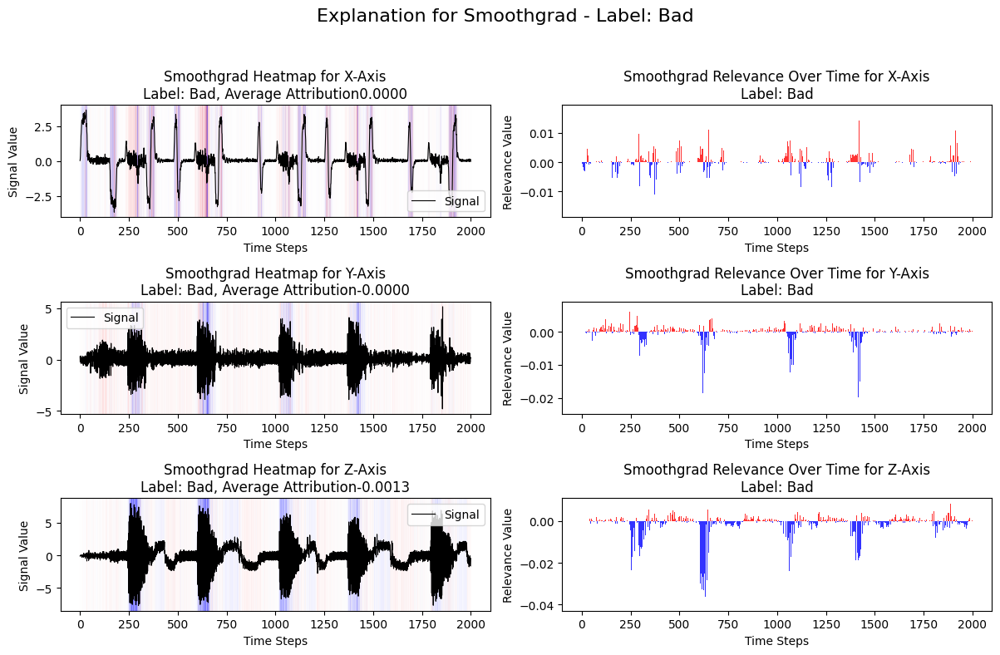

In [146]:
# SmoothGrad
smoothgrad_attr_b, _ = smoothgrad_relevance(best_model, sample_b)
print(f"Min relevance: {np.min(smoothgrad_attr_b.detach().cpu().numpy())}, Max relevance: {np.max(smoothgrad_attr_b.detach().cpu().numpy())}")
visualize_with_label_attribution(sample_b, smoothgrad_attr_b, label_b, "Smoothgrad")


In [147]:
# Example usage
summary_b_sg = summarize_attributions(smoothgrad_attr_b.detach().cpu().numpy())  # Pass your attributions here
# Flatten the summary dictionary and create a DataFrame
data_b_sg = []
for axis, values in summary_b_sg.items():
    row = {"Axis": axis}
    row.update(values)
    data_b_sg.append(row)

# Create the DataFrame
df_summary_b_sg = pd.DataFrame(data_b_sg)

# Display the DataFrame as a table
print(df_summary_b_sg)# Flatten the summary dictionary and create a DataFrame


     Axis  Positive Count  Total Positive Relevance  \
0  Axis 0            1073                  1.141157   
1  Axis 1            1246                  0.984311   
2  Axis 2             925                  1.120389   

   Average Positive Relevance  Negative Count  Total Negative Relevance  \
0                    0.001064             927                 -1.120973   
1                    0.000790             754                 -1.023298   
2                    0.001211            1075                 -3.772297   

   Average Negative Relevance  Total Relevance (Pos + Neg)  \
0                   -0.001209                     0.020184   
1                   -0.001357                    -0.038987   
2                   -0.003509                    -2.651908   

   Average Relevance (Pos + Neg)  
0                       0.000010  
1                      -0.000019  
2                      -0.001326  


Min relevance: -0.01507878303527832, Max relevance: 0.009562015533447266
 Maximum Absolute Attribution in Axis 0: 0.01507878303527832
 Maximum Absolute Attribution in Axis 1: 0.0064198970794677734
 Maximum Absolute Attribution in Axis 2: 0.01110529899597168


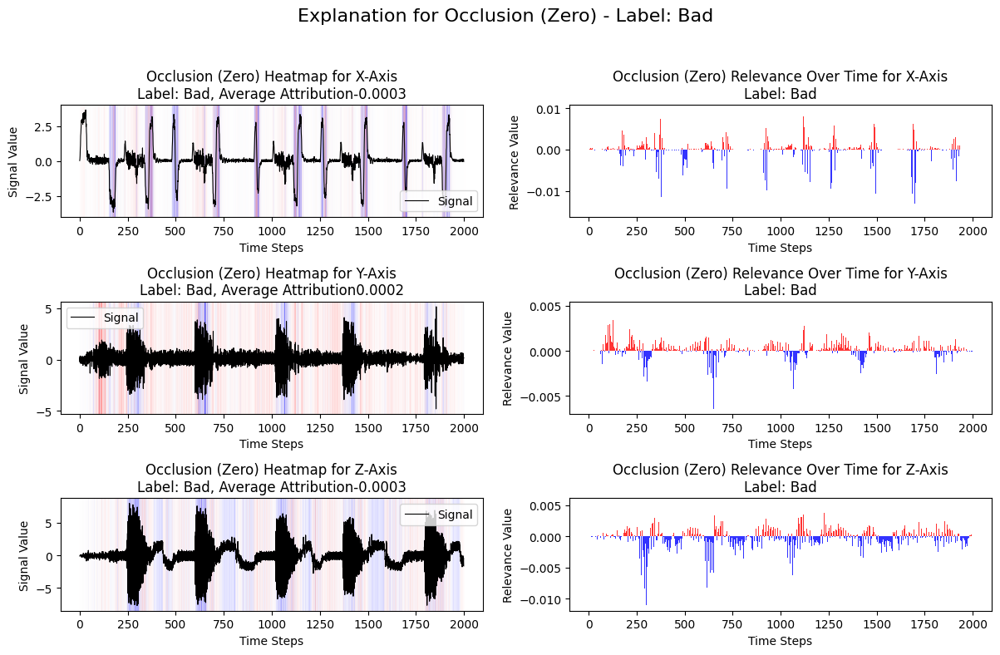

In [148]:
# Occlusion (zero-based occlusion)
occlusion_attr_zero_b, _ = occlusion_signal_relevance(best_model, sample_b, occlusion_type="zero")
print(f"Min relevance: {np.min(occlusion_attr_zero_b.detach().cpu().numpy())}, Max relevance: {np.max(occlusion_attr_zero_b.detach().cpu().numpy())}")
visualize_with_label_attribution(sample_b, occlusion_attr_zero_b, label_b, "Occlusion (Zero)")

Min relevance: -0.020957469940185547, Max relevance: 0.01159524917602539
 Maximum Absolute Attribution in Axis 0: 0.020957469940185547
 Maximum Absolute Attribution in Axis 1: 0.006947517395019531
 Maximum Absolute Attribution in Axis 2: 0.009593009948730469


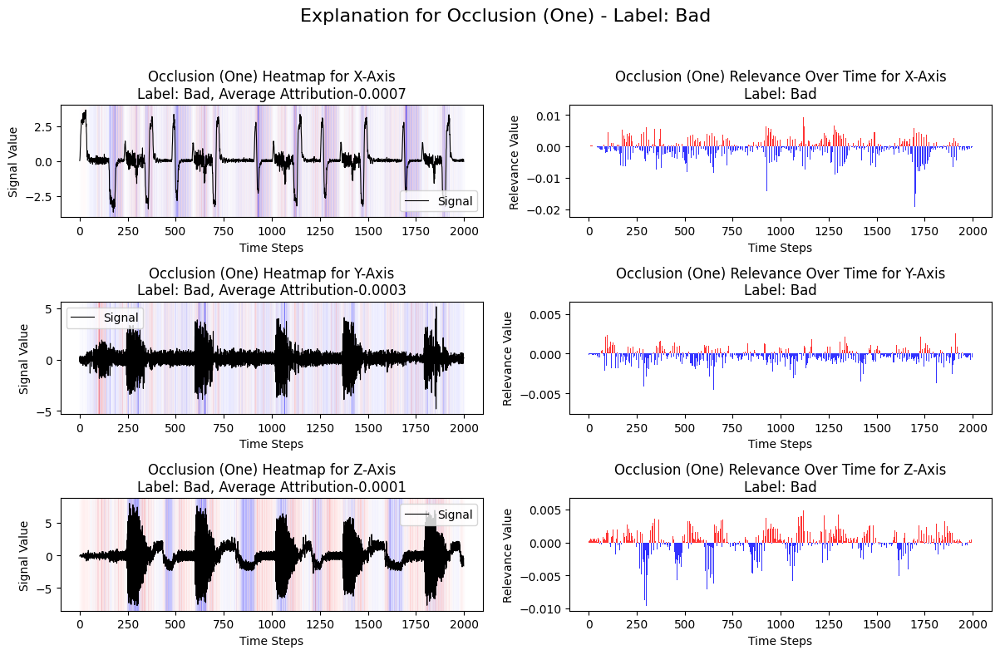

In [149]:
# Occlusion (one occlusion)
occlusion_attr_one_b, _ = occlusion_signal_relevance(best_model, sample_b, occlusion_type="one")
print(f"Min relevance: {np.min(occlusion_attr_one_b.detach().cpu().numpy())}, Max relevance: {np.max(occlusion_attr_one_b.detach().cpu().numpy())}")
visualize_with_label_attribution(sample_b, occlusion_attr_one_b, label_b, "Occlusion (One)")

Min relevance: -0.01919102668762207, Max relevance: 0.00875234603881836
 Maximum Absolute Attribution in Axis 0: 0.01919102668762207
 Maximum Absolute Attribution in Axis 1: 0.008008003234863281
 Maximum Absolute Attribution in Axis 2: 0.012435197830200195


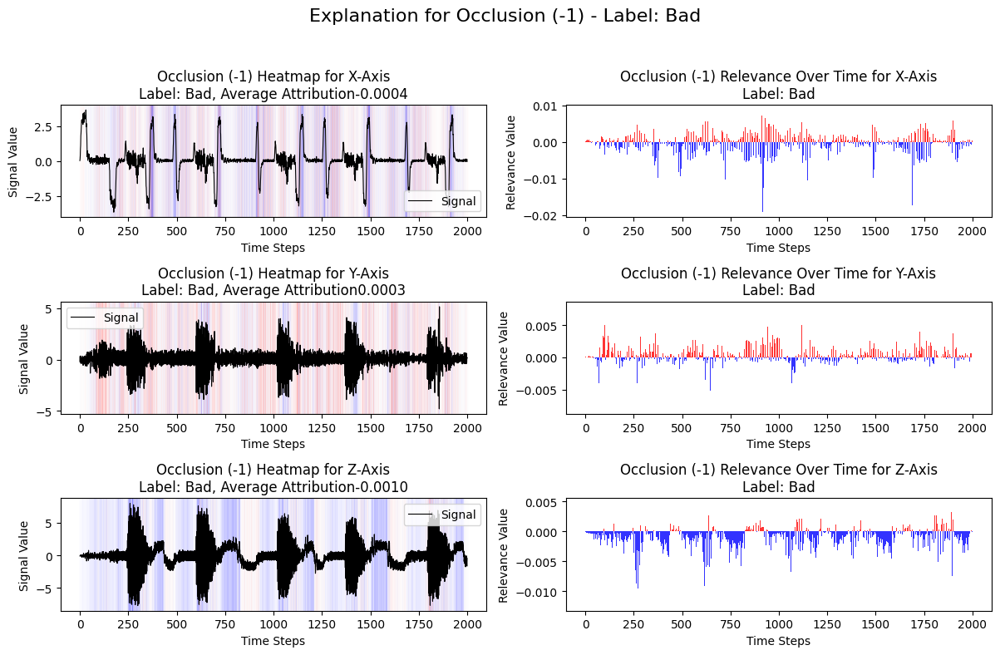

In [150]:
# Occlusion (-one occlusion)
occlusion_attr_mone_b, _ = occlusion_signal_relevance(best_model, sample_b, occlusion_type="mone")
print(f"Min relevance: {np.min(occlusion_attr_mone_b.detach().cpu().numpy())}, Max relevance: {np.max(occlusion_attr_mone_b.detach().cpu().numpy())}")
visualize_with_label_attribution(sample_b, occlusion_attr_mone_b, label_b, "Occlusion (-1)")

Min relevance: -0.027147293090820312, Max relevance: 0.012572288513183594
 Maximum Absolute Attribution in Axis 0: 0.027147293090820312
 Maximum Absolute Attribution in Axis 1: 0.011399507522583008
 Maximum Absolute Attribution in Axis 2: 0.016469955444335938


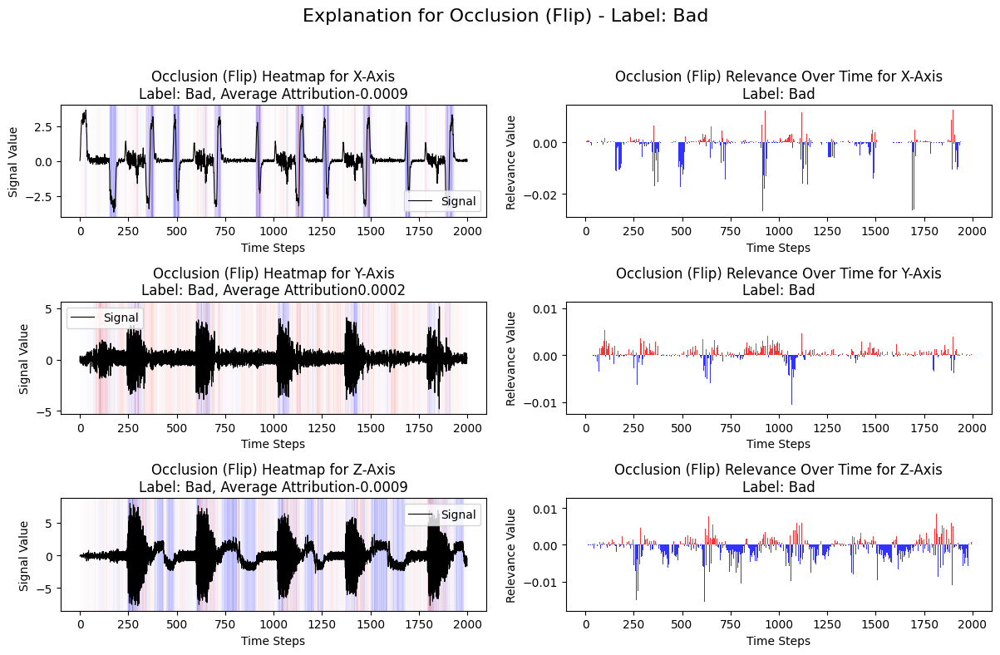

In [151]:

# Occlusion (e.g., zero-based occlusion)
occlusion_attr_flip_b, _ = occlusion_signal_relevance(best_model, sample_b, occlusion_type="flip")
print(f"Min relevance: {np.min(occlusion_attr_flip_b.detach().cpu().numpy())}, Max relevance: {np.max(occlusion_attr_flip_b.detach().cpu().numpy())}")

visualize_with_label_attribution(sample_b, occlusion_attr_flip_b, label_b, "Occlusion (Flip)")


In [152]:
relevance_time_b, relevance_freq_b, signal_freq_b, input_signal_b, freqs_b, predicted_label_b = compute_dft_lrp_relevance(
        model=best_model,
        sample=sample_b.cpu().detach().numpy(),  # Convert to NumPy for DFTLRP
        label=label_b.item(),
        device=device,
        signal_length=2000,
        sampling_rate=400  # Placeholder, replace with your actual sampling rate
    )

Input device in zennit_relevance: cuda:0
Model structure:
  - : CNN1D_DS_Wide
  - conv1: Conv1d
  - gn1: GroupNorm
  - pool1: MaxPool1d
  - conv2: Conv1d
  - gn2: GroupNorm
  - pool2: MaxPool1d
  - conv3: Conv1d
  - gn3: GroupNorm
  - pool3: MaxPool1d
  - global_avg_pool: AdaptiveAvgPool1d
  - fc1: Linear
  - fc2: Linear
  - dropout: Dropout
  - relu: ReLU
Successfully registered hooks
Input device in zennit_relevance_lrp: cuda:0
Model output shape: torch.Size([1, 2])
values shape:torch.Size([1])
Target output shape: (torch.Size([1, 2]), tensor([[0.0000, 3.6267]], device='cuda:0'))
Input sample shape: torch.Size([1, 3, 2000])
Relevance time shape: (3, 2000)
Input signal shape: (3, 2000)
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch.Size([2000, 2000])
Weight shape in create_fourier_weights: (2000, 2000)
Raw weight shape from dft_utils: (2000, 2000)
Weight shape after tensor conversion: torch

E:\Thesis\Datasets\CNC\utils\dft_lrp.py:124: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input = torch.tensor(input, dtype=dtype)


Relevance hat shape before multiplication: torch.Size([1, 2000])
Relevance hat shape after multiplication: torch.Size([1, 2000])
Input signal shape: (1, 2000)
Input relevance shape: (1, 2000)
Signal hat shape after transform: torch.Size([1, 2000])
Relevance hat shape before multiplication: torch.Size([1, 2000])
Relevance hat shape after multiplication: torch.Size([1, 2000])
Input signal shape: (1, 2000)
Input relevance shape: (1, 2000)
Signal hat shape after transform: torch.Size([1, 2000])
Relevance hat shape before multiplication: torch.Size([1, 2000])
Relevance hat shape after multiplication: torch.Size([1, 2000])


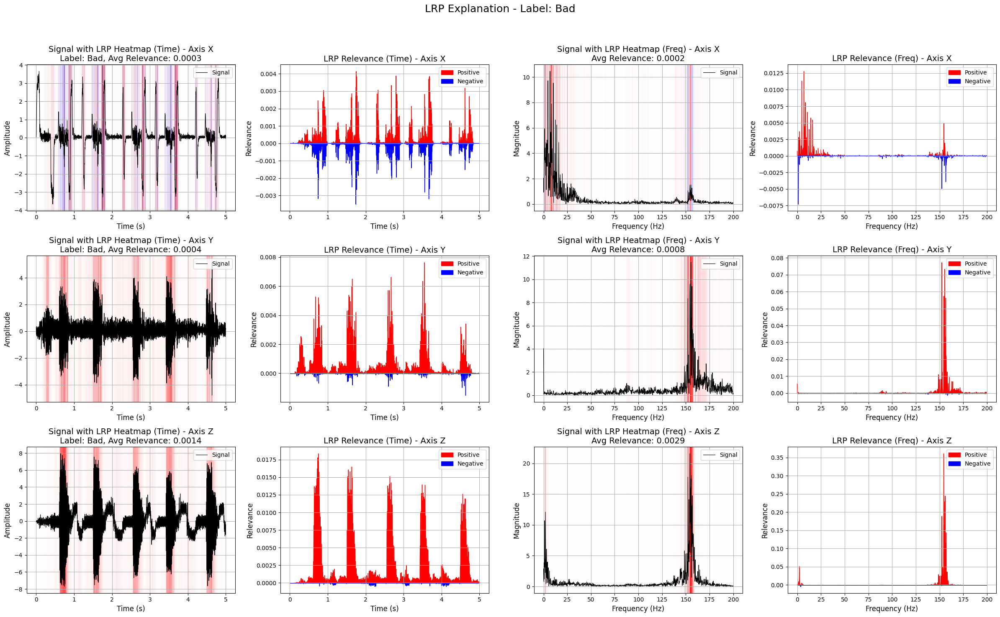

In [153]:
# Visualize the results
visualize_lrp_dft(
        relevance_time=relevance_time_b,
        relevance_freq=relevance_freq_b,
        signal_freq=signal_freq_b,
        input_signal=input_signal_b,
        freqs=freqs_b,
        predicted_label=predicted_label_b,
        k_max=1000,  # Plot up to 1000 Hz
        sampling_rate=400  # Placeholder, replace with your actual sampling rate
    )

In [154]:
summary_b_of = summarize_attributions(occlusion_attr_flip_b.detach().cpu().numpy())  # Pass your attributions here

# Flatten the summary dictionary and create a DataFrame
data = []
for axis, values in summary_b_of.items():
    row = {"Axis": axis}
    row.update(values)
    data.append(row)

# Create the DataFrame
df_summary = pd.DataFrame(data)

# Display the DataFrame as a table
print(df_summary)

     Axis  Positive Count  Total Positive Relevance  \
0  Axis 0            1007                  0.896882   
1  Axis 1            1268                  1.133493   
2  Axis 2             800                  0.990040   

   Average Positive Relevance  Negative Count  Total Negative Relevance  \
0                    0.000891             989                 -2.658678   
1                    0.000894             731                 -0.656447   
2                    0.001238            1199                 -2.814029   

   Average Negative Relevance  Total Relevance (Pos + Neg)  \
0                   -0.002688                    -1.761796   
1                   -0.000898                     0.477046   
2                   -0.002347                    -1.823988   

   Average Relevance (Pos + Neg)  
0                      -0.000883  
1                       0.000239  
2                      -0.000912  


In [155]:
summary_b_lrp = summarize_attributions( relevance_freq_b)  # Pass your attributions here

# Flatten the summary dictionary and create a DataFrame
data_lrp = []
for axis, values in summary_b_lrp.items():
    row = {"Axis": axis}
    row.update(values)
    data_lrp.append(row)

# Create the DataFrame
df_summary_lrp = pd.DataFrame(data_lrp)

# Display the DataFrame as a table
print(df_summary_lrp)

     Axis  Positive Count  Total Positive Relevance  \
0  Axis 0             647                  0.170294   
1  Axis 1             710                  0.776503   
2  Axis 2             720                  2.832821   

   Average Positive Relevance  Negative Count  Total Negative Relevance  \
0                    0.000263             354                 -0.045729   
1                    0.001094             291                 -0.016553   
2                    0.003934             281                 -0.025301   

   Average Negative Relevance  Total Relevance (Pos + Neg)  \
0                   -0.000129                     0.124565   
1                   -0.000057                     0.759949   
2                   -0.000090                     2.807520   

   Average Relevance (Pos + Neg)  
0                       0.000124  
1                       0.000759  
2                       0.002805  


In [156]:
""# Global Attribution over frequency with LRP
summary_lrp_t_b = summarize_attributions(relevance_time_b)  # Pass your attributions here
# Flatten the summary dictionary and create a DataFrame
data_lrp_t_b = []
for axis, values in summary_lrp_t_b.items():
    row = {"Axis": axis}
    row.update(values)
    data_lrp_t_b.append(row)

# Create the DataFrame
df_summary_lrp_t_b = pd.DataFrame(data_lrp_t_b)

# Display the DataFrame as a table
print(df_summary_lrp_t_b)

     Axis  Positive Count  Total Positive Relevance  \
0  Axis 0            1187                  0.341417   
1  Axis 1            1711                  0.787083   
2  Axis 2            1732                  2.832012   

   Average Positive Relevance  Negative Count  Total Negative Relevance  \
0                    0.000288             813                 -0.216894   
1                    0.000460             289                 -0.027139   
2                    0.001635             268                 -0.025076   

   Average Negative Relevance  Total Relevance (Pos + Neg)  \
0                   -0.000267                     0.124523   
1                   -0.000094                     0.759943   
2                   -0.000094                     2.806936   

   Average Relevance (Pos + Neg)  
0                       0.000062  
1                       0.000380  
2                       0.001403  


In [157]:
relevance_time_fft_b, relevance_freq_fft_b, signal_freq_fft_b, relevance_timefreq_fft_b, signal_timefreq_fft_b, input_signal_fft_b, freqs_fft_b, predicted_label_fft_b = compute_fft_lrp_relevance(
        model=best_model,
        sample=sample_b,
        label=label_b,
        signal_length=2000,
        sampling_rate=400,
        compute_timefreq=True,
        window_shift=64,  # Increased to reduce memory usage
        window_width=128,
        window_shape="rectangle"
    )

Input sample shape: torch.Size([1, 3, 2000])
Target label: tensor([1], device='cuda:0')
Input device in zennit_relevance: cuda:0
Model structure:
  - : CNN1D_DS_Wide
  - conv1: Conv1d
  - gn1: GroupNorm
  - pool1: MaxPool1d
  - conv2: Conv1d
  - gn2: GroupNorm
  - pool2: MaxPool1d
  - conv3: Conv1d
  - gn3: GroupNorm
  - pool3: MaxPool1d
  - global_avg_pool: AdaptiveAvgPool1d
  - fc1: Linear
  - fc2: Linear
  - dropout: Dropout
  - relu: ReLU
Successfully registered hooks
Input device in zennit_relevance_lrp: cuda:0
Model output shape: torch.Size([1, 2])
values shape:torch.Size([1])
Target output shape: (torch.Size([1, 2]), tensor([[0.0000, 3.6267]], device='cuda:0'))
relevance_time_tensor shape before squeeze: (1, 3, 2000)
relevance_time shape after squeeze: (3, 2000)
input_signal shape: (3, 2000)
fft_lrp: Input relevance shape = (1, 2000), signal shape = (1, 2000)
fft_lrp: relevance_tensor shape = torch.Size([1, 2000]), signal_tensor shape = torch.Size([1, 2000])
fourier_transform: s

E:\Thesis\Datasets\CNC\utils\fft_lrp.py:24: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\Copy.cpp:308.)
  arr = torch.from_numpy(arr).to(dtype=self.dtype)


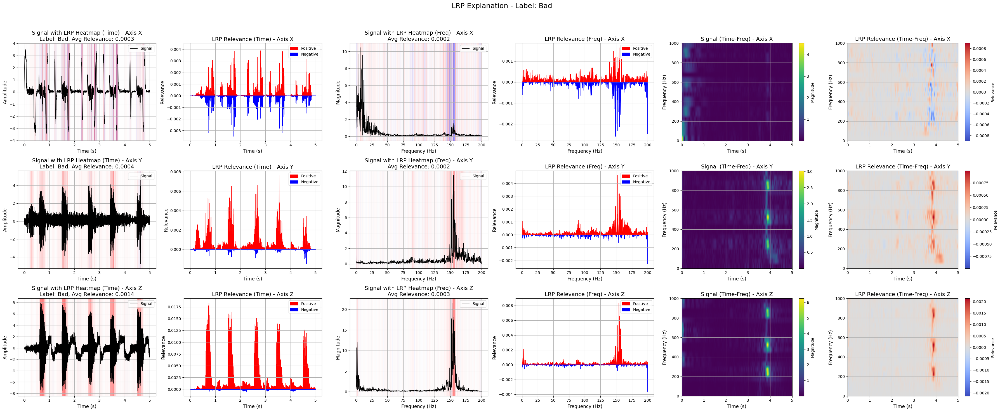

In [158]:
# Visualize
visualize_lrp_fft(
    relevance_time=relevance_time_fft_b,
    relevance_freq=relevance_freq_fft_b,
    signal_freq=signal_freq_fft_b,
    relevance_timefreq=relevance_timefreq_fft_b,
    signal_timefreq=signal_timefreq_fft_b,
    input_signal=input_signal_fft_b,
    freqs=freqs_fft_b,
    predicted_label=predicted_label_fft_b,
    signal_length=2000,
    sampling_rate=400,
    k_max=1000
)